# Apache TVM: тензорный компилятор для ML решений

_**Егор Чураев**_

*Sr. Software Engineer, Deelvin Solutions*

*Аспирант, НИУ ВШЭ*

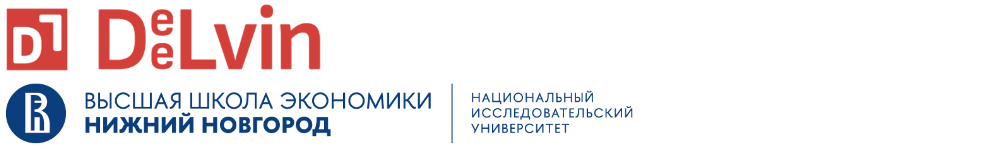

## План лекции 

- [Обзор решений для запуска нейронных сетей](#Обзор-решений-для-запуска-нейронный-сетей)
- [Знакомство с TVM](#Знакомство-с-TVM)
- [Установка TVM](#Установка-TVM)
- [Первое знакомство с TVM. Компиляция модели](#Первое-знакомство-с-TVM.-Компиляция-модели)
- [Архитектура TVM](#Архитектура-TVM)
- [Relay](#Relay)
- [Немного о будущем: Relax](#Немного-о-будущем:-Relax)
- [Настройка (тюнинг) модели в TVM](#Настройка-(тюнинг)-модели-в-TVM)
- [Задание](#Задание)

# Обзор решений для запуска нейронный сетей

В данном разделе рассмотрим различные проекты, предназначенные для эффективного запуска нейронных сетей.

## Экосистема программных инструментов и платформ для машинного обучения

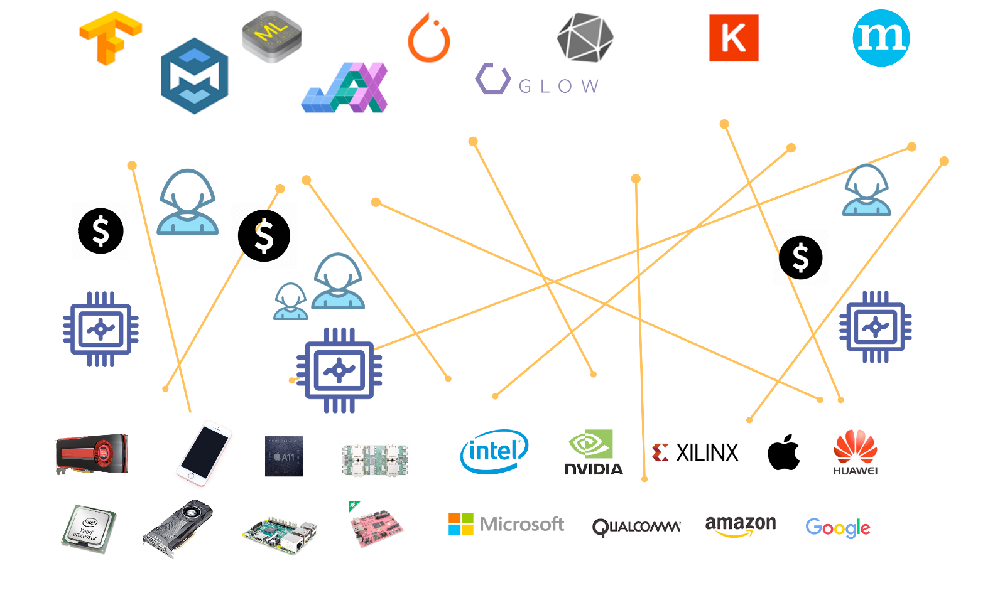

Алгоритмы искусственного интеллекта (ИИ) сегодня широко используются во многих сферах жизни человека. Они влияют на многие аспекты нашей жизни, улучшая её качество и позволяя переложить часть вопросов на технику. ИИ делает устройства вокруг нас более интеллектуальными. Оперируя большими данными, смартфон нам подскажет, когда выйти из дома, чтобы прийти на остановку одновременно с автобусом, а датчики, установленные в современном автомобиле, помогут избежать различных опасных ситуаций и не попасть в дорожно-транспортное происшествие.

Благодаря растущим возможностям аппаратного обеспечения и новым алгоритмам ИИ исследователи и разработчики совершенствуют существующие алгоритмы и предлагают новые более эффективные решения для реальных задач.

Популярность и потенциал решений, основанных на ИИ, поддерживается большим набором различных программных инструментов, которые позволяют обучать и запускать модели на различных устройствах, а также широким спектром различных аппаратных решений: от крошечных ML чипов, использующихся в интернете вещей (IoT - Internet of Things) и мобильных устройствах, до мощных серверов, нацеленных на решение задач ИИ. IT гиганты (такие как NVidia, Google, Intel, Qualcomm и т.д.) и многие стартапы выпускают на рынок новые аппаратные решения для ИИ.

Подобный рост экосистемы программного и аппаратного обеспечения усложняет этап развёртывания ИИ решений. Запуск обученной ML модели на любом аппаратном устройстве, поддерживающем ИИ, является довольно сложной задачей.

## Инструменты для развёртывания нейронных сетей

- Ключевые игроки:
    - HW vendors – NVidia, Intel and others 
    - OS vendors –  Goolge, Microsoft, Apple 
    - Deep Learning Framework Vendors – Facebook, Alibaba, Baidu


Для решения проблемы разработки и развёртывания ИИ решений многие компании предлагают свои специализированные программные продукты.

Компании, специализирующиеся на выпуске аппаратных платформ выпускают устройства, нацеленные на эффективное исполнение алгоритмов ИИ, а также ПО для использования всех возможностей платформы, например, OpenVINO от компании Intel или TensorRT от NVidia.

Такие компании как Google, Microsoft и Apple также имеют продукты для запуска ИИ решений, такие как TFLite, ONNX Runtime и CoreML соответственно.

Другие крупные игроки, такие как Facebook и Alibaba имеют собственные продукты для глубокого обучения. Например, PyTorch создали разработчики из Facebook, а MNN разрабатывается компанией Alibaba.

- Какие технические преимущества?
    - Простота развёртывания
    - Производительность
        - Оптимальная задержка и пропускная способность
        - Использование возможностей и встроенных функций платформы
        - Оптимизации уровня графа
    - Эффективное использование памяти

Использоание подобных программных продуктов сильно упрощает жизнь разработчиков на этапе разработки и продуктизации ML решений. 

Благодаря удобному API достигается простота развёртывания финальных решений. Для получения максимальной производительности разработчики оптимизируют реализации ML алгоритмов, используя аппаратные особенности каждой из платформ, а также эффективно работают с памятью.

- Какие бизнес цели?
    - Привязанность к экосистеме производителя

Поставщики решений для развёртывания ML моделей инвестируют довольно много инженерных ресурсов для достижения максимальной эффективности их решений, а также чтобы решить проблему "многие (SW) ко многим (HW)". Выпуская эффективный продукт, компании решают свои бизнес задачи и стараются привязать разработчиков к своей экосистеме.

- Схема, иллюстрирующая преимущества определенного Inference Engine (на примере NVidia TensorRT):

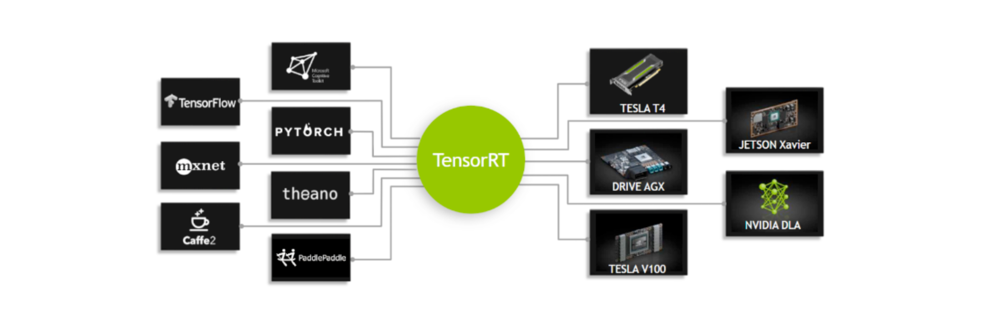

Рисунок выше иллюстрирует пример экосистемы от компании NVidia, которая предлагает свой продукт, позволяющий эффективно запускать модели из различных программных продуктов (таких как TensorFlow, Pytorch или mxnet) на широком спектре своих видеокарт. 

## Информация о некоторых инструментах для развёртывания нейронных сетей

|         Framework        |            Vendor           |     Open   Source    |                                                                                                                        Key   comments                                                                                                                       |               Target   OSes              |                                 Target   platforms                                 |
|:------------------------:|:---------------------------:|:--------------------:|:-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------:|:----------------------------------------:|:----------------------------------------------------------------------------------:|
|          TensorRT        |            Nvidia           |           No         |     Unified   and powerful toolkit for NVidia ecosystem                                                                                                                                                                                                     |              Linux,   Windows            |                                    NVidia   GPUs                                   |
|          OpenVINO        |             Intel           |          Yes         |     Unified   and powerful toolkit for Intel/x86 ecosystem                                                                                                                                                                                                  |          Linux,   Windows, MacOS         |                              x86,   i/dGPU,   VPU, ARM                             |
|        ONNXRuntime       |           Microsoft         |          Yes         |     Vendor   agnostic API. Convenient if you do not want to depend on HW vendor API.   Mostly just a wrapper on top of HW vendors IEs                                                                                                                       |          Linux,   Windows, MacOS         |               NVidia   GPUs, x86, ARM, i/dGPU,   VPU, Xilinx FPGA, etc             |
|        Apache   TVM      |     Community   project     |          Yes         |     Vendor   agnostic API. Compiler based + ML algorithms to find the best performant path                                                                                                                                                                  |     Linux,   Windows, MacOS, Embedded    |     NVidia   GPUs, x86, ARM, d/mGPU,   Xilinx FPGA, micro controllers, etc         |
|     TensorFlow   Lite    |            Google           |          Yes         |     Great   tool for Android ecosystem to deploy modern solutions on Android targets (and   not only)                                                                                                                                                       |               Android,   iOS             |                                 ARM,   Mali GPU, TPU                               |
|      Pytorch   mobile    |           Facebook          |          Yes         |     Way   to deploy Torch models to mobile devices (Android and iOS ) without need to   use other serialization formats and APIs      Limited capabilities. Implemented through Torch.jit   but a lot of ops and modern topologies are not supported yet    |               Android,   iOS             |                                   ARM,   Mali GPU                                  |
|            MNN           |            Alibaba          |          Yes         |     Blazing   fast (according to authors and some people who tried :))                                                                                                                                                                                      |               Android,   iOS             |                                   ARM,   Mali GPU                                  |
|           CoreML         |             Apple           |           No         |     Unified   and powerful toolkit for Apple ecosystem                                                                                                                                                                                                      |                MacOS,   iOS              |                                   ARM,   GPU, NPU                                  |

В таблице представлен краткий обзор решений от упомянутых производителей. Большинство из них имеют значительное сходство по функциональности и поддержке новых трендов (например, квантование). Также большая часть программных продуктов, за исключением ПО от NVidia и Apple, имеют открытый исходный код.

## Сходства и различия в различных Inference Engines

- Девайс-независимые оптимизации (обычно выполняются в оффлайн):
    - Свёртка констант — уменьшает избыточные вычисления, путём замены константных выражений и переменных на их значения.
    - Operations fusion - комбинирует несколько операций в один вычислительный кернел.
- Девайс-специфичные оптимизации:
    - Блокирование, разбивка для лучшего использования векторизации и загрузки аппаратных ресурсов
    - Pattern matching: сопоставление определённого подграфа с операциями высокого уровня

Оптимизации, применяемые в программных комлексах для запуска ML моделей, можно разделить на два типа. Это девайс-независимые и девайс-специфичные оптимизации. Девайс-независимые оптимизации обычно происходят в оффлайн (или на этапе компиляции модели). К этим оптимизациям относятся свёртка констант (constant folding), Batch Norm fusion, Operations fusion и другие.

Девайс-специфичные операции могут выбираться в режиме реального времени в зависимости от конечного устройства, на котором модель должна быть запущена. К ним относятся блокирование и разбивка рабочего пространства для более эффективного использования векторизации и загрузки вычислительных мощностей устройства. А так же patttern matching - нахождение в графе шаблонов, которые представляют собой операции высокого уровня и вызов этих операций (например, нахождение паттерна свёртки в низко-уровневом TF графе).

<div style="display:flex;width:100%;height:auto;">
    <div style="background-color:aliceblue;padding:10px;width:50%;margin:10px;">
        <div style="margin:10px;"><center><b><u>ОПТИМИЗИРОВАННЫЕ РЕАЛИЗАЦИИ ПРИМИТИВОВ</u></b></center></div>
        <div style="display:flex;width:100%;height:auto;">
            <div style="width:47%;">
                <center>Эвристика (layout, примитивная реализация выбора)</center>
            </div>
            <div style="width:6%;">
                <center>+</center>
            </div>
            <div style="width:47%;">
                <center>Оптимизированные примитивы из низкоуровневых библиотек (cuDNN, oneDNN, ACL)</center>
            </div>
        </div>
        <div style="margin:10px;"><center><b>(OpenVINO, TensorRT)</b></center></div>
    </div>
    <div style="background-color:AntiqueWhite;padding:10px;width:50%;margin:10px;">
        <div style="margin:10px;"><center><b><u>ОПТИМИЗАЦИЯ РЕАЛИЗАЦИИ КОМПИЛЯТОРОМ</u></b></center></div>
        <div style="display:flex;width:100%;height:auto;">
            <div style="width:47%;">
                <center>Тензорный компилятор</center>
            </div>
            <div style="width:6%;">
                <center>+</center>
            </div>
            <div style="width:47%;">
                <center>Большое пространство поиска оптимизаций</center>
            </div>
        </div>
        <div style="margin:10px;"><center><b>(Halide, Apache TVM)</b></center></div>
    </div>
</div>

Есть несколько способов для определения того, какую из девайс-специфичных оптимизаций лучше применить для целевого устройства. Например, инженерами может быть написана эвристика, которая, основываясь на макете данных или на каких-то других критериях, выбирает наиболее оптимальную реализацию для эффективного исполнения примитива. А для реализации зачастую используются оптимизированные примитивы из низкоуровневых библиотек, таких как cuDNN, oneDNN и другие.

Другой подход основан на использовании тензорного компилятора и большого пространства поиска оптимального решения. Таким образом компилятор сам находит наиболее оптимальную конфигурацию (использование векторизации или же эффективное разложение данных в памяти) для исполнения примитивов на целевом устройстве.

# Знакомство с TVM

## "Муки выбора" инструментов для запуска

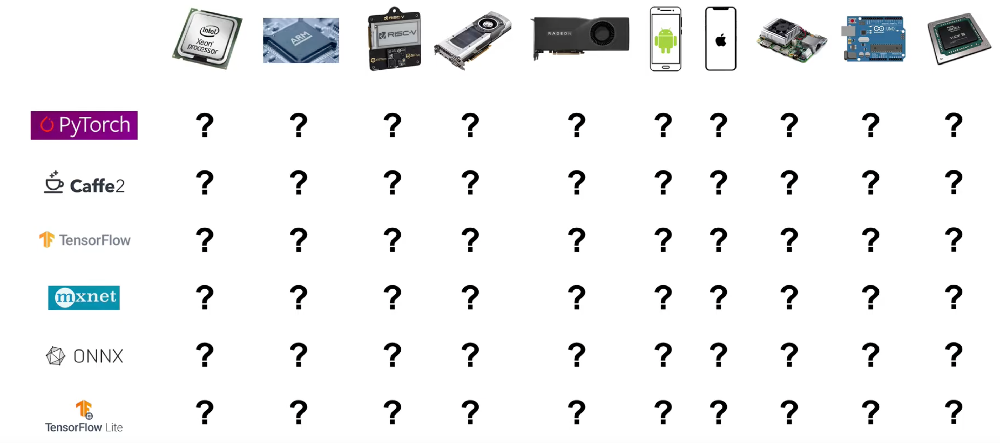

Допустим, что вы обучили свою модель с использованием одной из платформ: PyTorch, TensorFlow, MxNet или что-то ещё. Затем необходимо принять решение, где вы хотите развернуть свою обученную модель. Выбор наилучшего варианта программного комплекса для запуска модели на целевом устройстве может быть довольно не простым. Например, если вы хотите развернуть TFLite модель на процессоре ARM, то вам повезло и вы сможете использовать интерпретатор TFLite и эффективно запустить свою модель. 

Но если вы хотите развернуть свою модель caffe2 на процессоре ARM, то это будет не так просто сделать, т.к. caffe2 не поддерживает микроархитектуры. Какие тогда есть варианты?
1. Возможно, вы сможете найти библиотеку, которая позволит вам запустить эту модель на вашей архитектуре.
2. Вы можете переписать модель в TensorFlow Lite, однако это означает, что вам придётся заново обучать модель.
3. Вы можете попробовать найти конвертер, который сконвертирует модель в формат фреймворка, который вы можете использовать для развёртывания модели на вашем устройстве.

Таким образом, вы можете представить, как много сценариев вам надо учитывать, если вы захотите эффективно запустить вашу модель на новом устройстве.

## TVM: связующее звено ПО и аппаратных ускорителей

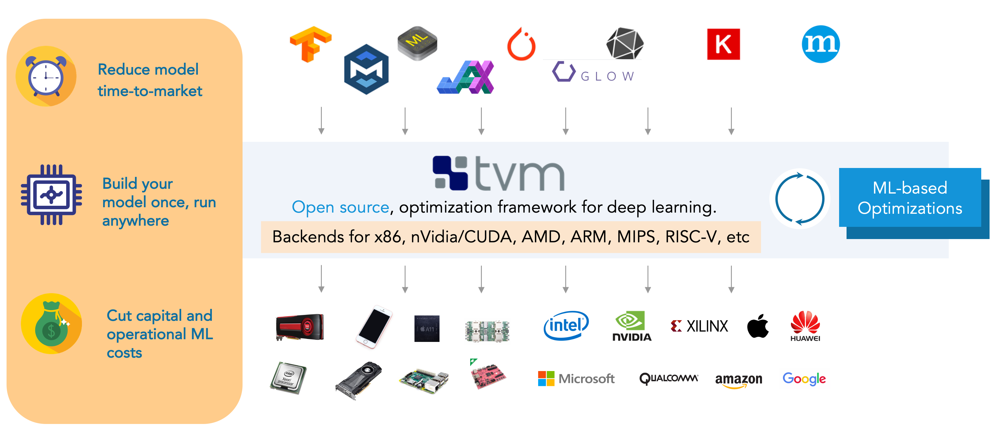

К счастью, для этой проблемы развёртывания существует решение - TVM. Apache TVM предоставляет компиляторный стек для DL систем. TVM имеет открытый исходный код, может работать с моделями из различных платформ, таких как PyTorch, TensorFlow, ONNX и другие, а конечная модель может быть скомпилирована под широкий спектор различных архитектур, включая x86, arm, графические карты от NVidia, Intel и AMD и т.д. Также TVM поддерживается большинством операционных систем, включая Linux, Mac, iOS, Android, Windows и другие.

Огромный вклад в развитие TVM вносит компания [OctoML](https://octoml.ai/), которая предоставляет своё решение, позволяющее максимально упростить и ускорить процесс развёртывания модели на любом устройстве. Продукт OctoML основан на Apache TVM, а также многие из сотрудников OctoML стояли у истоков TVM. Многие крупные компании используют продукт OctoML для автоматизации процесса ускорения своих моделей.

## Что такое TVM?

- Растущее сообщество: 780+ участников, 8.9k звёзд на гитхаб: https://github.com/apache/tvm
- Принадлежит сообществу
- Активный форум для обсуждений: https://discuss.tvm.apache.org/
- Регулярные встречи и конференции (например, https://www.tvmcon.org/)

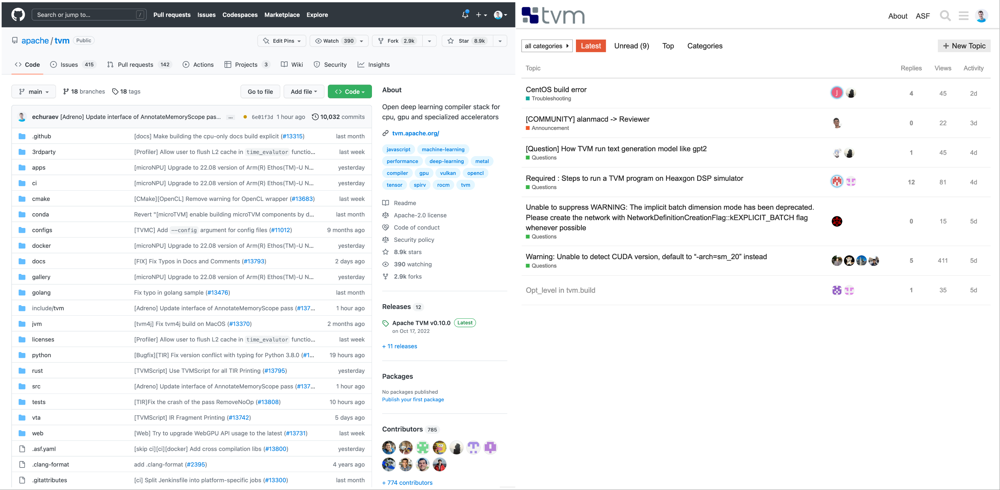

TVM имеет растущее сообщество из более чем 780 участников, а также почти 9000 звёзд на [github](https://github.com/apache/tvm). TVM включён в Apache Software Foundation. Это означает, что он полностью принадлежит сообществу, нет ни одной компании, которая контролирует TVM. Вместо этого многие участники отрасли участвуют в его разработке и вносят свой вклад в развитие TVM. 

Кроме того, существует довольно активный [форум](https://discuss.tvm.apache.org/) для обсуждений, где можно обсудить любые вопросы, связанные с TVM и быстро получить на них ответы. На форуме обсуждаются совершенно разные темы: от планирования будущих функций до сообщений об ошибках и получения помощи в использовании и настройке TVM.

Также регулярно проводятся встречи и конференции, связанные с TVM. Каждую неделю проводятся митинги сообщества TVM, куда может прийти каждый и обсудить свои вопросы.

## Кто использует TVM?

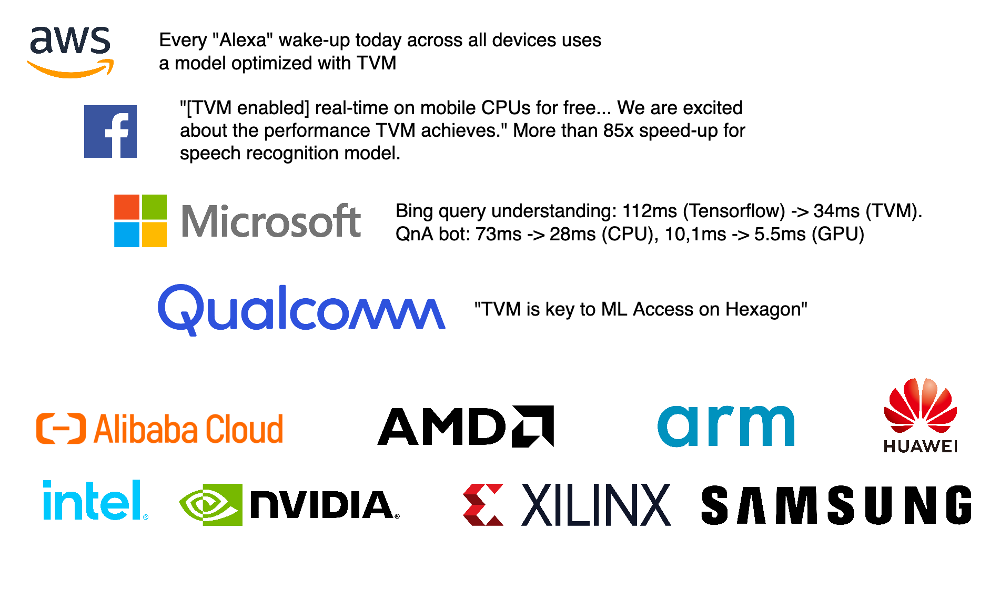

Apache TVM уже оказало довольно большое влияние на отрасль. Например, каждое вызов Алексы (голосовой помощник от Амазона) использует модель, оптимизированную с помощью TVM. В Facebook TVM позволил без особых усилий запустить модели, работающие в реальном времени на CPU. Благодаря Apache TVM их модель распознавания речи была ускорена более чем в 85 раз. Время понимания запросов Bing было улучшено с 112 мс до 34 мс с использованием модели, оптимизированной с помощью TVM. А в Qualcomm TVM является основным инструментом, который позволяет получить доступ к ML возможностям на Hexagon (DSP от Qualcomm). Также множество других компаний, производящих программное и аппаратное обеспечение (Huawei, Intel, Sabsung, AMD, arm и другие), используют TVM в своих продуктах. 

## Какие вопросы решает TVM?

- Портативность:
  - Когда возможности аппаратного обеспечения для развёртывания модели ограничены.

Одна из проблем, которую TVM пытается решить - это проблема переносимости. Если у вас ограничены аппаратные ресурсы для развёртывания вашей модели, а вам нужно иметь возможность запустить модель на этом целевом устройтве.

- Эффективность:
  - Когда нужно получить максимум эффективности из целевой платформы.

Кроме этого TVM - это отличный инструмент, если вам надо максимально эффективно использовать целевую платформу. TVM имеет различные параметры конфигураций кода, которые позволяют оптимизировать модель для конкретного оборудования.

- Поддержка программного стека:
  - Когда необходимо создать программный стек для вашей аппаратной системы.

Если у вас есть новая аппаратная платформа и вам нужно создать программный стек для неё, который позволит ML инженерам использовать ваше устройство, то TVM - это отличный выбор для решения подобной задачи.

## Почему я должен использовать TVM? ML Engineer

**_<u>1. Портативность:</u>_**

- **ML Engineer:** "В целом я очень доволен TensorFlow/PyTorch, однако, меня попросили развернуть модель на платформе, которая не поддерживается/плохо поддерживается этими фреймворками."

Рассмотрим на практических примерах, почему вам стоит использовать TVM. Например, Вы - ML Engineer. Вам необходимо взять обученную модель и запустить её на довольно нестандартном оборудовании. Это устройство имеет ограниченную SRAM, не широко распространённую операционную систему и не поддерживает C++. Обычно Вас вполне устраивают инструменты подобные TensorFLow или PyTorch, но целевая платформа не поддерживается или плохо поддерживается этими фреймворками.

- **<font color='red'>Проблема:</font>** не x86 архитектура, неподдерживаемый GPU/DSP или другой ускоритель, не широко распространённая ОС.

Проблема заключается в том, что в популярных фреймворках может отсутствовать поддержка запуска моделей для архитектуры, отличной от x86, для неподдерживаемых ускорителей или для не широко распространённых операционных систем.

- **<font color='green'>Решение:</font>** TVM предоставляет возможность развёртывания ML моделей на платформах, где в других случаях развёртывание было бы довольно сложным.

TVM может помочь решить эту проблему. Он предоставляет возможность развёртывания ML на платформах, где развёртывание может быть довольно сложным из-за особенностей архитектуры, ОС и т.д. TVM может использоваться для компиляции модели в подобном случае.

## Почему я должен использовать TVM? ML-Sys Engineer

**_<u>2. Эффективность:</u>_**

- **ML-Sys Engineer:** "Я ориентируюсь на запуск модели на довольно популярной системе (например, x86 или GPU), но хочу получить от своей модели максимальную производительность. Каждая миллисекунда, которую я выигрываю после оптимизации модели, приводит к экономии большого числа денег для нашего сервиса, который работает в облаке."

Запуск моделей ИИ в центрах обработки данных требует больших затрат от компаний, например, таких как Facebook. Например, инженер по системам машинного обучения хочет получить максимальную производительность от своей модели и каждая выигранная миллисекунда приводит к значительной экономии денег компании.

- **<font color='red'>Проблема:</font>** большинство фреймворков используют библиотеки, оптимизированные для общих сценариев использования. Также фрейммворк может иметь неэффективные интерпретаторы.

Проблема в том, что большинство фрейворков используют библиотеки, оптимизированные для общих сценариев использования, и это означает, что они могут не использовать все возможности целевой платформы для достижения максимальной производительности.

- **<font color='green'>Решение:</font>** TVM предоставляет механизмы настройки и оптимизации модели для создания библиотеки, которая будет настроена для максимально эффективной работы вашей модели на целевом устройстве.

TVM решает эту проблему, предоставляя возможности оптимизации модели для целевого устройства. Это означает, что во время настройки операции будут использовать все возможности устройства для достижения максимальной производительности. 

## Почему я должен использовать TVM? Производитель аппаратных платформ

**_<u>3. Поддержка программного стека:</u>_**

- **Производитель аппаратных платформ:** "Я создал очень хорошую и эффективную аппаратную платформу. Теперь я бы хотел создать программный стек, чтобы специалисты по машинному обучению могли легко использовать все возможности моего устройства."

Третий вариант использования относится больше к производителям аппаратного оборудования, которые хотят поддержать ML программный стек для своей платформы. В последнее время появляется всё больше компаний, которые создают своё аппаратное оборудование для ИИ. Довольно серьёзная проблема, которая встала перед ними - создание стека программного обеспечения, которое позволило бы ML инженерам использовать их платформы для запуска своих моделей. Итак, в третьем сценарии производитель оборудования выпустил очень хорошую аппаратную платформу и хотел бы поддержать программный стек для этой платформы.

- **<font color='red'>Проблема:</font>** создание полного стека компилятора для DL - это очень сложно и дорого. Для чего вы хотите создать поддержку? TensorFlow? PyTorch? ONNX runtime? Всё вышеперечисленное?

Проблема состоит в том, что создание полного стека для глубокого обучения требует больших финансовых и временных затрат. Необходимо определиться с тем, для какого фреймворка необходимо добавить поддержку: TensorFlow, PyTorch или же любой из доступных? Соответственно в зависимости от объёма задачи придётся инвестировать больше ресурсов для достижения хорошего результата.

- **<font color='green'>Решение:</font>** TVM предоставляет различные абстракции для интеграции кодогенерации для новой аппаратной платформы или даже интеграции программных библиотек, оптимизированных для аппаратного обеспечения.

TVM предоставляет различные абстракции для добавления кодогенерации для новой аппаратной платформы. Таким образом, для того, чтобы поддержать новую платформу необходимо реализовать часть, отвечающую за генерацию эффективного кода. Поддержка различных фреймворков машинного обучения будет получена автоматически за счёт модульной архитектуры TVM.

# Установка TVM

## Варианты установки TVM

Установка TVM подробно описана на официальном сайте в разделе с документацией: https://tvm.apache.org/docs/install/index.html

Варианты установки:
- Сборка TVM лоакально из исходного кода
- Использование TVM построенного внутри Docker контейнера
- Установка TVM локально через pip (Linux, MacOS)

Использование TVM в Docker мы рассматривать не будем. Сам процесс подробно описан в документации.

## Сборка TVM из исходного кода. Сборка библиотеки

- Выкачиваем исходный код TVM с github:
  ```bash
  git clone https://github.com/apache/tvm.git; cd tvm
  ```
- Обновляем и выкачиваем все подмодули:
  ```bash
  git submodule update --init --recursive
  ```

- Устанавливаем все необходимые зависимости: https://tvm.apache.org/docs/install/from_source.html

- Создаём директорию куда будет производиться сборка:
  ```bash
  mkdir build && cd build
  ```
- Конфигурируем и запускаем сборку:
  ```bash
  cmake -DCMAKE_BUILD_TYPE=Release -DUSE_LLVM=ON -DUSE_RANDOM=ON -DUSE_GRAPH_RUNTIME=ON -DUSE_SORT=ON  .. && make -j4
  ```

В случае если система не сможет найти LLVM, то необходимо в опцию `-DUSE_LLVM` передать путь к `llvm-confing`.

## Сборка TVM из исходного кода. Установка TVM модуля в Python

- Добавляем пути до модуля в `PYTHONPATH`:
  ```bash
  export TVM_HOME=/path/to/tvm
  export PYTHONPATH=$TVM_HOME/python:${PYTHONPATH}
  ```

## Установка TVM через pip

- Проверяем доступные версии для установки

In [1]:
!pip install apache-tvm==

ERROR: Could not find a version that satisfies the requirement apache-tvm== (from versions: 0.9.0, 0.10.0)
ERROR: No matching distribution found for apache-tvm==


- Устанавливаем последнюю стабильную версию TVM:

In [2]:
!pip install apache-tvm

- Или выбираем специальную версию для установки:

In [ ]:
!pip install --pre apache-tvm~=0.11

Пред-релизные версии tvm доступны для установки на платформе Linux. Поэтому на Mac OS я использую версию TVM, которую построил из исходного кода.

- Проверяем версию TVM:

In [3]:
import tvm
print(tvm.__version__)

0.11.dev0


# Первое знакомство с TVM. Компиляция модели

## Импорт модели в TVM

- Документация, описывающая компиляцию моделей из различных фреймворков с помощью TVM: https://tvm.apache.org/docs/how_to/compile_models/index.html
- Интерфейс, с помощью которого можно выполнять импорт моделей:
  ```python
    import tvm
    from tvm import relay
    
                  relay.frontend.from_coreml(coreml_model, shape_dict)
                  relay.frontend.from_mxnet(mxnet_model, shape_dict)
    mod, params = relay.frontend.from_pytorch(scripted_model, shape_list)
                  relay.frontend.from_onnx(onnx_model, shape_dict)
                  relay.frontend.from_keras(keras_model, shape_dict)
  ```

С подробным описанием того, как можно загрузить модель из различных программных комплексов можно ознакомиться на [сайте с документацией](https://tvm.apache.org/docs/how_to/compile_models/index.html). Выше приведён пример интерфейсов, с помощью которых можно загружать модели из различных фреймворков. В основном интерфейс функций схож. Иногда для отдельных импотрёров добавляются дополнительные параметры, например, макет, который используется в модели, или тип данных.

## Создание простой свёрточной модели для распознавания цифр из набора MNIST

- Статья, на основе которой создавалась модель Keras: https://towardsdatascience.com/building-a-convolutional-neural-network-cnn-in-keras-329fbbadc5f5
- Установим необходимые библиотеки:

In [ ]:
!pip install keras tensorflow matplotlib

Для демонстрации того, как работать с нейронными сетями из других фреймворках в TVM, создадим простую свёрточную сеть и будем её использовать для демонстрации возможностей TVM.

Уменьшим уровень логирования TensorFlow, чтобы игнорировать сообщения о том, с какими инструкциями TF был построен.

In [4]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '1'

- Импортируем набор MNIST и загружаем данные:

In [5]:
from keras.datasets import mnist # download mnist data and split into train and test sets
(X_train, y_train), (X_test, y_test) = mnist.load_data()

- Выводим размер изображения и отрисовываем его с помощью `matplotlib`:

Image shape:  (28, 28)


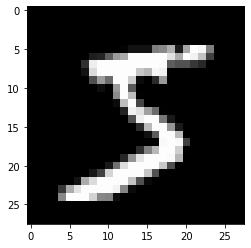

In [6]:
import matplotlib.pyplot as plt # plot the first image in the dataset
print("Image shape: ", X_train[0].shape)
plt.imshow(X_train[0], cmap='gray')

## Подготавливаем данные

- Добавляем размерность с каналом в массивы с тренировочными и тестовыми данными:

In [7]:
# reshape data to fit model
X_train = X_train.reshape(60000,28,28,1)
X_test = X_test.reshape(10000,28,28,1)

- Преобразуем числовые значения классов в бинарные вектора:

In [8]:
from keras.utils import to_categorical

y_train = to_categorical(y_train)
y_test = to_categorical(y_test)

print(y_train[0])

[0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]


## Создаём модель

In [9]:
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Flatten

# create model
model = Sequential()
# add model layers
model.add(Conv2D(64, kernel_size=3, activation="relu", input_shape=(28,28,1), name="input"))
model.add(Conv2D(32, kernel_size=3, activation="relu"))
model.add(Flatten())
model.add(Dense(10, activation="softmax"))

Модель будет содержать два свёрточных нейронных слоя с активацией `relu` и выходной полносвязанный слой с активацией `softmax`.

- Компилируем и выводим информацию о модели:

In [10]:
# compile model using accuracy to measure model performance
model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input (Conv2D)              (None, 26, 26, 64)        640       
                                                                 
 conv2d (Conv2D)             (None, 24, 24, 32)        18464     
                                                                 
 flatten (Flatten)           (None, 18432)             0         
                                                                 
 dense (Dense)               (None, 10)                184330    
                                                                 
Total params: 203,434
Trainable params: 203,434
Non-trainable params: 0
_________________________________________________________________


- Обучаем модель в течении 3-х эпох. Полученная точность составляет 97.74%.

In [11]:
# train the model. Accuracy: 97.74%
model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=3)

Epoch 1/3
1875/1875 [==============================] - 75s 40ms/step - loss: 0.2447 - accuracy: 0.9514 - val_loss: 0.1347 - val_accuracy: 0.9599
Epoch 2/3
1875/1875 [==============================] - 74s 40ms/step - loss: 0.0688 - accuracy: 0.9793 - val_loss: 0.0798 - val_accuracy: 0.9748
Epoch 3/3
1875/1875 [==============================] - 72s 38ms/step - loss: 0.0469 - accuracy: 0.9854 - val_loss: 0.0823 - val_accuracy: 0.9774


- Загружаем или сохраняем веса модели:

In [12]:
if False:
    model.save_weights('../Common/my_mnist_weights.h5')
else:
    model.load_weights('../Common/my_mnist_weights.h5')

Для того, чтобы не тратить время на обучение модели во время презентации, загружаем сохранённые веса.

- Сохраним модель, она нам понадобится на следующей лекции:

In [13]:
model.save("../Common/mnist_keras_model")

INFO:tensorflow:Assets written to: ../Common/mnist_keras_model/assets


INFO:tensorflow:Assets written to: ../Common/mnist_keras_model/assets


- Проверяем точность на 10 эллементах из тестовой выборки:

In [14]:
import numpy as np

# predict first 4 images in the test set
print("Prediction: ", np.argmax(model.predict(X_test[:10]), axis=1))
print("Labels:     ", np.argmax(y_test[:10], axis=1))

1/1 [==============================] - 0s 91ms/step
Prediction:  [7 2 1 0 4 1 4 9 5 9]
Labels:      [7 2 1 0 4 1 4 9 5 9]


## Импортируем модель в TVM

- Подключаем необходимые модули:

In [15]:
import tvm
from tvm import relay
from tvm.contrib import graph_executor

- Загружаем модель из Keras в TVM:

In [16]:
input_shape = [1, 28, 28, 1] # [batch, height, width, channels]
shape_dict = {"input_input": input_shape}
mod, params = relay.frontend.from_keras(model, shape_dict, layout="NHWC")
print(mod)

def @main(%input_input: Tensor[(1, 28, 28, 1), float32], %v_param_1: Tensor[(3, 3, 1, 64), float32], %v_param_2: Tensor[(64), float32], %v_param_3: Tensor[(3, 3, 64, 32), float32], %v_param_4: Tensor[(32), float32], %v_param_5: Tensor[(10, 18432), float32], %v_param_6: Tensor[(10), float32]) {
  %0 = nn.conv2d(%input_input, %v_param_1, padding=[0, 0, 0, 0], channels=64, kernel_size=[3, 3], data_layout="NHWC", kernel_layout="HWIO");
  %1 = nn.bias_add(%0, %v_param_2, axis=-1);
  %2 = nn.relu(%1);
  %3 = nn.conv2d(%2, %v_param_3, padding=[0, 0, 0, 0], channels=32, kernel_size=[3, 3], data_layout="NHWC", kernel_layout="HWIO");
  %4 = nn.bias_add(%3, %v_param_4, axis=-1);
  %5 = nn.relu(%4);
  %6 = nn.batch_flatten(%5);
  %7 = nn.dense(%6, %v_param_5, units=10);
  %8 = nn.bias_add(%7, %v_param_6);
  nn.softmax(%8)
}



Указываем входную размерность модели. Мы будем обрабатывать по одной картинке размером 28х28 пикселей, изображение содержит всего один канал, т.е. является чёрно-белым.

Затем модель в формате Keras передаётся на вход функции-импортёру `relay.frontend.from_keras`, которая возвращает нам 2 объекта: 
- `mod` - модель в формате TVM.
- `params` - константные параметры (веса) модели.

Если мы распечатаем `mod`, то увидим представление модели в `Relay`. Небольшое введение в `Relay` у нас будет [позднее](#Relay). А распечатав `params`, мы увидим просто массивы с числами.

- Указываем устройство, для которого модель должна быть скомпилирована и устройство, на котором модель будет запущена:

In [17]:
target = tvm.target.Target("llvm  -mcpu=core-avx2")
dev = tvm.cpu(0)

В данном случае мы указываем, что хотим скомпилировать нашу модель под CPU с поддержкой векторных инструкций. 

В переменной `dev` указываем, на каком устройстве модель должна будет быть исполнена. Указав `tvm.cpu(0)` мы будем использовать центральный процессор. В случае если на устройстве есть несколько устройств, например, несколько видеокарт, то мы можем выбрать необходимую, передавая различный индекс, например, `tvm.opencl(1)` указывает, что мы хотим использовать второй из доступных ускорителей с поддержкой OpenCL.

- Строим модель и создаём для неё `GraphExecutor`:

In [18]:
with tvm.transform.PassContext(opt_level=3):
    tvm_model = relay.build_module.create_executor("graph", mod, dev, target, params).evaluate()

Перед построением модели мы указываем `PassContext`, с которым мы хотим производить сборку. `PassContext` позволяет контролировать то, какие оптимизации будут применяться на уровне графа. Если `PassContext` не был указан, то по умолчанию сборка будет запущена с `opt_level=2`. Можно указать разичный уровень оптимизаций. Подробнее можно почитать [тут](https://tvm.apache.org/docs/reference/api/python/relay/transform.html#tvm.relay.transform.build_config).

Затем вызывается функция, создающая отдельный Executor, который мы будем использовать для запуска модели на локальном компьютере. Указывая `graph`, мы создаём объект, который будет использовать графовое представление для запуска модели. Подробнее можно почитать [тут](https://tvm.apache.org/docs/reference/api/python/relay/index.html?highlight=create_executor). Затем передаются остальные параметры, такие как модель, устройство для запуска модели, платформа, под которую модель должна быть скомпилирована и параметры.

Сообщения, которые выводятся на экран во время сборки модели (`conv2d NHWC layout is not optimized for x86 with autotvm.`) говорят нам о том, что модель не была настроена под целевое устройство (в данном случае х86) и, скорее всего, производительность будет далека от идеала.

- Проверяем точность модели, запущенной с помощью TVM:

In [19]:
out = []
for data in X_test[:10]:
    # HWC -> NHWC
    out.append(tvm_model(data.reshape(1, 28, 28, 1)).numpy()[0])

print("Prediction: ", np.argmax(out, axis=1))
print("Labels:     ", np.argmax(y_test[:10], axis=1))

Prediction:  [7 2 1 0 4 1 4 9 5 9]
Labels:      [7 2 1 0 4 1 4 9 5 9]


# Архитектура TVM

## Классический компилятор

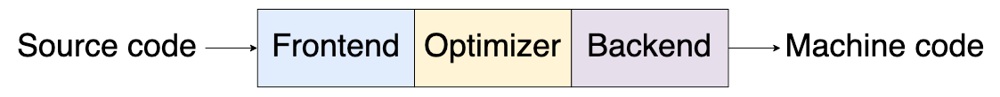

Давайте немного отвлечёмся и начнём с обзора структуры классического компилятора. Это поможет нам понять идею TVM. Что такое компилятор? Компилятор - это программа, которая берёт исходный код других программ, написанный людьми, и превращает его во что-то понятное компьютерам.
Компиляторы освободили инженеров от необходимости осваивать команды процессора и писать сложный, низкоуровневый код и позволили даже начинающим создавать быстрые и эффективные программы. Без хороших компиляторов, весь мир программного обеспечения был бы намного медленнее, дороже и более подвержен ошибкам.

На рисунке выше представлена схема трёхфазного компилятора. Фронтенд анализирует исходный код, проверяет его на наличие ошибок и строит абстрактное синтаксическое дерево для представления исходного кода. Затем оптимизатор отвечает за выполнение широкого спектра различных преобразований, чтобы постараться улучшить время выполнения кода. Например, удаляется лишний код, устраняются избыточные вычисления, что-то вычисляется на этапе компиляции и т.п. Работа оптимизатора не зависит от того, на каком языке была написана программа и на каком конечном устройстве код будет исполнен. Бэкенд или генератор кода сопоставляют код, полученный после работы оптимизатора с набором инструкций, которые поддерживаются целевым устройством. Кроме создания правильного конечного кода, бэкенд отвечает за создание эффективного кода, который будет использовать преимущества и различные встроенные функции платформы для достижения максимальной производительности. Общие части компиляторных бэкендов включают в себя выбор инструкций, распределение регистров и т.п. 

Кстати, jvm является примером подобной реализации. Байт-код Java используется в качестве интерфейса между фронтэндом и оптимизатором.

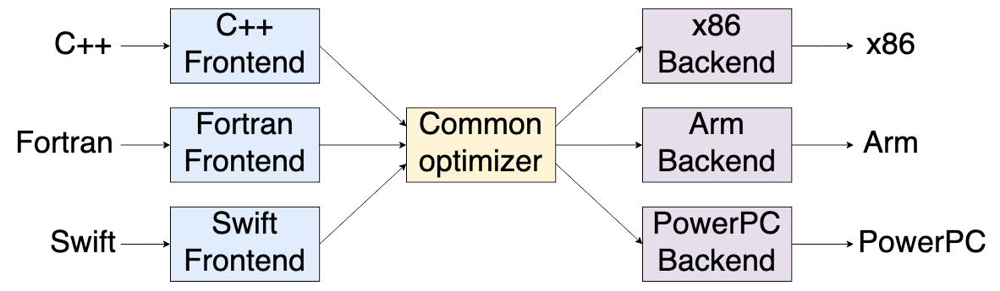

Обычно классические компиляторы работают следующим образом: на вход подаётся исходный код из различных языков (представлены в левой части схемы), и оптимизатор связывает фронтенды для этих языков с различными бэкендами, генерирующими код для целевых архитектур.

Такой дизайн позволяет поддержать большое число языков программирования и различных целевых архитектур без необходимости реализовывать общие оптимизации. Обычно фронтенды генерируют некоторое промежуточное представление кода (IR - Intermediate Representation, например, компилятор LLVM генерирует LLVM IR), которое передаётся в оптимизатор. Если компилятор использует промежуточное представление кода, то фронтенд может быть написан для любого языка, без необходимости изменять оптимизатор или бэкенд. Также и бэкенд можно написать для любой архитектуры и при этом исходный код из всех фронтендов автоматически сможет компилироваться с этим бэкендом. 

При таком дизайне добавление поддержки нового языка, например, Pascal, требует только реализации фронтенда для этого языка, а оптимизатор и кодогенераторы будут переиспользованы. В проекте LLVM, который является довольно популярным компилятором, используется именно этот метод, и он поддерживает многие семейства языков, такие как C++, Java, .Net, Python, Ruby, Haskell, OpenCL и др.

## Компилятор для ML

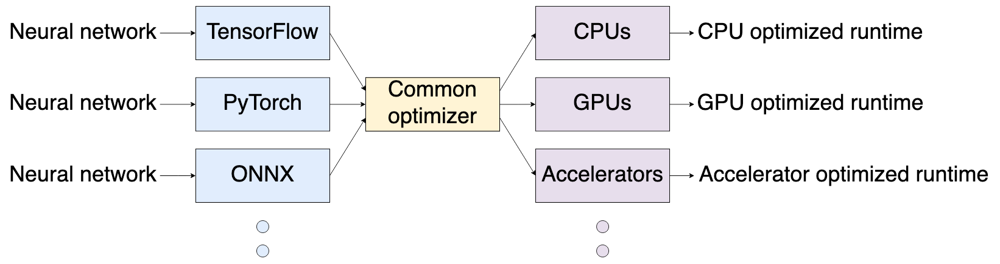

Комплияторы для машинного обучения делают что-то подобное. Слева, вместо языков программирования из предыдущей схемы, на вход ML компилятору подаётся модель в формате одного из ML фреймворков. Модель преобразуется в промежуточный формат и оптимизатор применяет различные оптимизации. Затем генерируется код для различных аппаратных устройств, таких как CPUs, GPUs или другие ускорители, такие как FPGA (ПЛИС), DSP или NPUs.

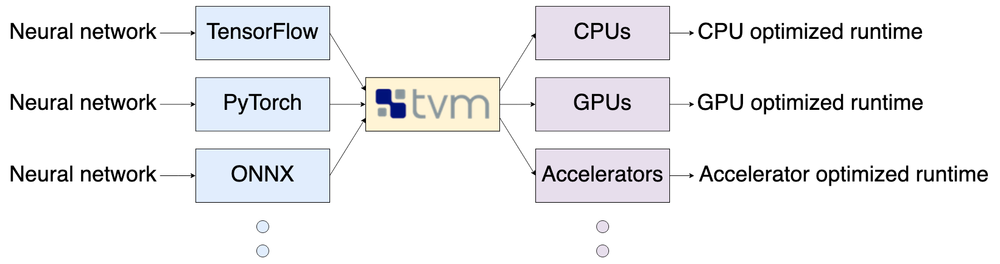

Именно такая схема и используется в TVM. Он является звеном, которое соединяет различные фреймворки глубокого обучения, такие как TensorFlow, PyTorch, ONNX и другие, с различными аппаратными ускорителями. TVM производит оптимизации на уровне графа и операторов, чтобы обеспечить переносимость производительности DL моделей для различных аппаратных платформ.


## Как работает TVM?

1. **Оптимизации на уровне графа**<br>
   Переписывает dataflow граф (узлы и рёбра), чтобы упростить граф и уменьшить использование памяти устройства.
2. **Оптимизации на уровне операторов**<br>
   Аппаратные девайс-специфичные низкоуровневые оптимизации для отдельных операторов/узлов в графе.
3. **Эффективная среда выполнения**<br>
   Модели, оптимизированные с TVM, работают в легковесной среде выполнения (TVM runtime), предоставляя минимальный API для загрузки и выполнения модели. API доступен на языках Python, C++, Rust, Go и другие.

Рассмотрим, как работает TVM. У TVM есть набор различных особенностей за счёт которых происходит ускорение модели. 

Одной из особенностей являются оптимизации на уровне графа. TVM переписывает граф, которым представлена нейронная сеть, чтобы упростить его и уменьшить использование памяти. Для примера, TVM объединяет небольшие операторы в один оператор, который выполняет несколько операций. Последовательность операций `conv2d -> bias_add -> relu` будут объединены в один оператор `conv2d_bias_add_relu`, который сможет выполнить эти 3 операции эффективнее с точки зрения производительности и использования памяти. Так же к подобным оптимизациям относится:
- Сворачивание констант (constant folding), которое на этапе компиляции вычисляет части графа, которые могут быть определены статически, что снижает затраты во время исполнения. 
- Планирование статической памяти, которое предварительно вычисляет память для хранения каждого промежуточного тензора.
- Преобразование макета данных, которое преобразует внутренние макеты данных в удобные для бэкенда форматы. Например, код, который генерируется для Adreno GPU будет быстрее работать, если сможет использовать блочные форматы данных (NHWC4c) и таким образом будут задействованны аппаратные векторные возможности для ускорения вычислений.

Кроме этого, TVM выполняет оптимизации на уровне операторов, которая в большей степени нацелена на аппаратную оптимизацию более низкого уровня. Например, в зависимости от размера кэша циклы, в которых происходит вычисления могут быть написаны по-разному, чтобы избежать проблемы не попадания в кэш и улучшить время выполнения.

И, наконец, когда вы оптимизируете смою модель, вы запускаеет её с использованием среды выполнения TVM. Это облегчённая система времени выполнения, которая предоставляет минимальный API для загрузки и выполнения вашей оптимизированной модели. API доступен на языках Python, C++, Rust, Go и другие.

## Операторы глубокого обучения

- Глубокая нейронная сеть выглядит как направленный ациклический граф (Directed Acyclic Graphs, DAG)
- Операторы - это строительные блоки (узлы) нейросетевых моделей
- Ребра сети представляют поток данных между операторами


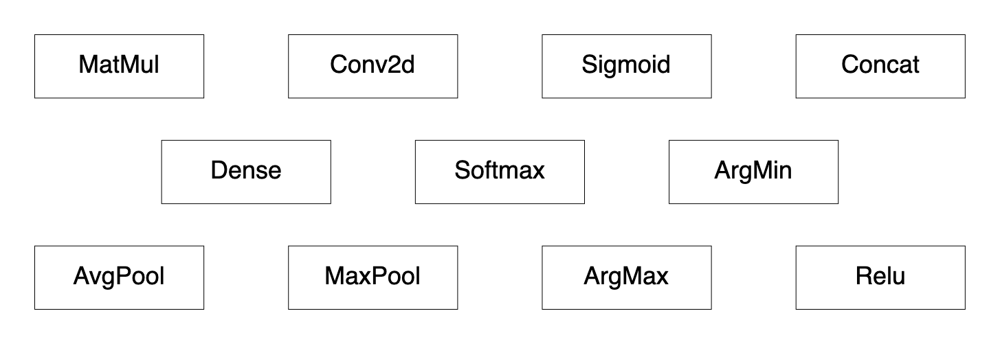

Было упомянуто, что TVM выполняет оптимизацию на уровне оператора. На рисунке выше представлено, что такое операторы в нейронных сетях. Это различные операции, такие как умножение матриц, свёртка, объединение, функция сигмоид, полносвязанные слои и т.д. Рёбра, между этими операторами или узлами, представляют собой поток данных, перемещающийся между операторами. Эти операторы не зависят от аппаратного обеспечения, и когда вы создаёте нейронную сеть, она не обязательно знает что-то об оборудовании, на котором будет работать. Затем, когда пользователь через ключи компиляции специфицирует на каком устройстве будет работать нейронная сеть, то TVM применяет множество оптимизаций, чтобы выполнение операторов было максимально эффективно на целевом устройстве.

## Схема работы TVM

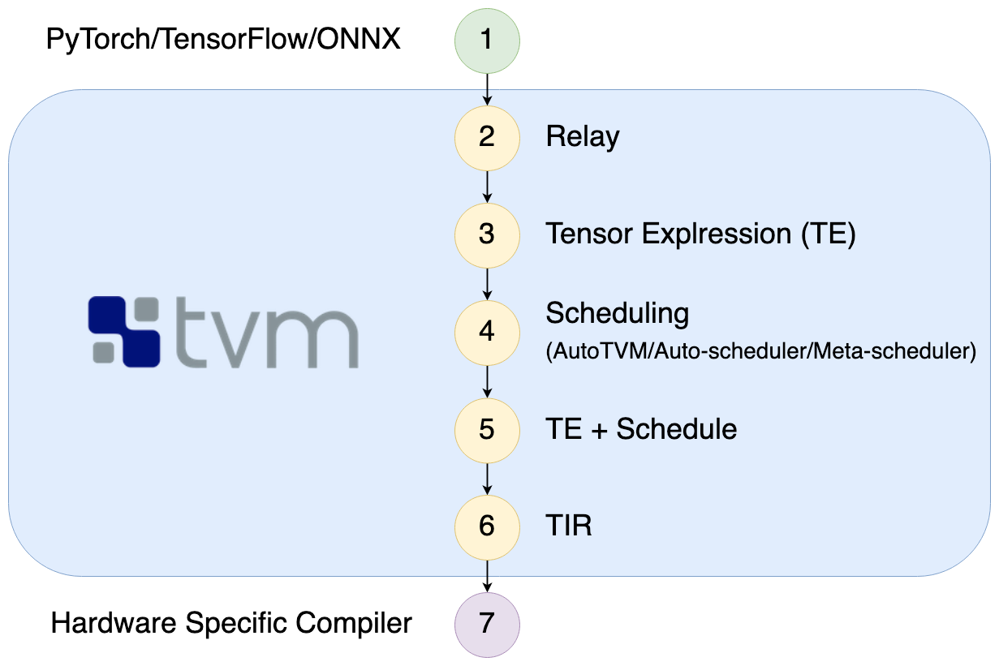

Выше представлена общая схема внутреннего устройства TVM. Основная цель компилятора, такого как TVM - это с использованием оптимизаций ускорить модель так, чтобы она эффективно работала на целевом устройстве. При этом точность модели должна остаться на том же уровне, что и была до компиляции. Рассмотрим эту схему подробнее.
1. **Импорт модели.** Вы импортируете свою нейронную сеть в промежуточный формат TVM, в Relay. Импортёр просто берёт модель в формате TensorFlow, PyTorch или в любом другом и строит из него фрагмент AST графа, который затем преобразуется в Relay.
2. **Relay.** Relay - это промежуточный (IR) формат TVM. По сути, Relay обеспечивает независимый от DL фреймворка способ представления этой нейронной сети в TVM. Это идеально подходит для дальнейших оптимизаций как на уровне графа, так и на аппаратном уровне. На этом же этапе происходят некоторые оптимизации графа, такие, как constant folding.
3. **Tensor Expression (TE).** На третьем шаге для каждого оператора в графе у нас есть соответствующее тензорное выражение, которое описывает то, каким образом тот или иной оператор (например, matmul или conv2d) должен быть реализован аппаратно-независимым способом. Relay может брать тензорные варажения и затем комбинировать и компилировать его, таким образом, чтобы получить наилучшую производительность. Как это понимать? Представьте, что вы даёте TVM рецепт для приготовления обеда. Затем TVM может переупорядочить этот рецепт и изменить несколько шагов, чтобы приготовить обед более эффективно. Но в конечном результате вы получите ту же еду. 
4. **Scheduling.** Четвёртый этап - это этап планирования. Первым поколением алгоритмов планирования был Auto-TVM, затем Auto-Scheduler, а в настоящее время идёт активная разработка третьего поколения - Meta-Scheduler. Всё планирование выполняется автоматически. Основываясь на описании тензорного выражения, автоматический планировщик создаст расписание, которое улучшит производительность на целевом устройстве. Таким образом, TVM определяет пространство поиска возможных расписаний, а затем ищет идеальное расписание.
5. **TE + Schedule.** Расписание, которое было найдено на предыдущем шаге, применяется к тензорному выражению для получения окончательного кода и из него генерируется TIR.
6. **Tensor IR (TIR).** TIR - это промежуточное представление низкого уровня в TVM. TIR уже содержит реализации операторов, которые будут исполняться на целевом устройстве. Но реализация этих операторов пока ещё аппаратно-независима.
7. **Генерация аппаратно-специфичного кода.** Из полученного TIR кода генерируется аппаратно-специфичный код. Таким образом, когда мы компилируем под CPU будет использоваться LLVM для генерации конечного кода. Если необходимо будет запускать модель на GPU, то будет использоваться генератор кода для OpenCL, Cuda, Metal или какой-либо другой.

## Компоненты TVM

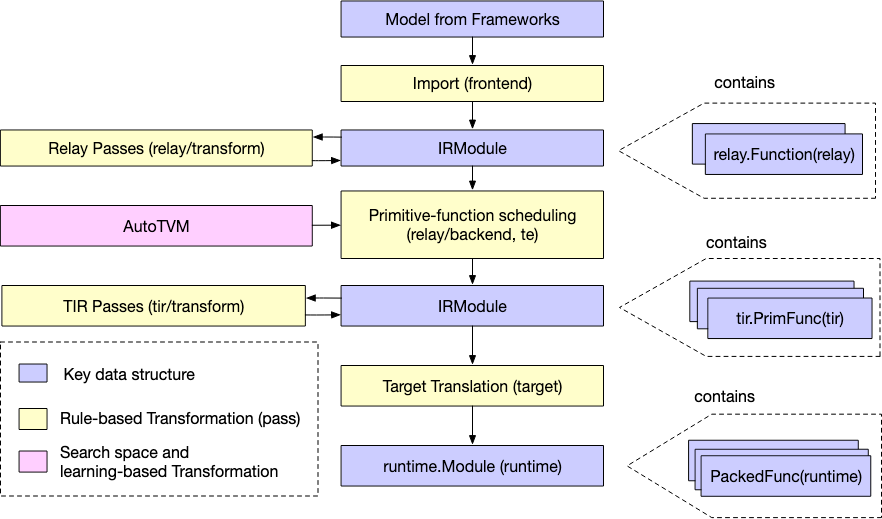

Документация: https://tvm.apache.org/docs/arch/index.html

На изображении выше представлена почти такая же схема, как была раньше про [схему работы TVM](#Схема-работы-TVM). Эта схема была взята из официальной документации TVM. Здесь можно видеть, что TVM состоит из множества блоков. Такая архитектура позволяет TVM быть очень гибким и расширяемым. Например, если вы хотите добавить новый оператор в TVM, то после добавления оператора, этот оператор может быть применён ко всем другим случаям, когда такой шаблон/операция будет обнаружена. И такое небольшое дополнение может помочь улучшить производительность многих других топологий.

# Relay

## Давайте взглянем на Relay

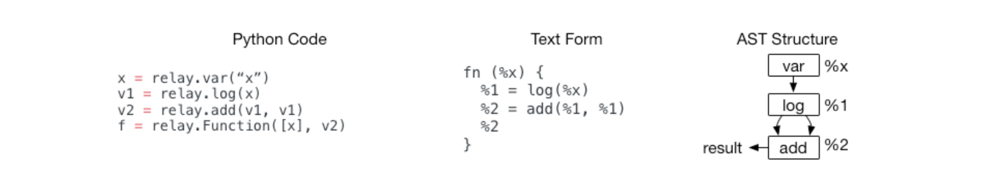

Документация: https://tvm.apache.org/docs/arch/relay_intro.html

Relay - это промежуточное представление высокого уровня в Apache TVM.

Традиционные фреймворки глубокого обучения используют вычислительные графы в качестве промежуточного выполнения. Вычислительный граф - это ориентированный ациклический граф (DAG), который представляет последовательность вычислений в модели. Простота вычислительных графов упрощает реализацию автоматического дифференцирования и компиляции для гетерогенных сред выполнения (например, выполнение частей графа на специализированном оборудовании).

Relay можно использовать для построения вычислительного графа. Например, код на изображении выше показывает как построить двухузловой граф. Рассмотрим как это можно сделать.

- Устанавливаем зависимость для `relay_viz`:

In [20]:
!pip install graphviz

`relay_viz` используется для визуализации Relay графа.

- Подключение необходимых библиотек:

In [21]:
import numpy as np

import tvm
from tvm import relay
from tvm.contrib import relay_viz

- Строим простой двухузловой граф с использованием Relay:

In [22]:
x = relay.var('x')
v1 = relay.log(x)
v2 = relay.add(v1, v1)
f = relay.Function([x], v2)

Используя функции из модуля Relay, описываем наш граф. Объявляем переменную `relay.var('x')`, вычисляем функцию `log`: `relay.log(x)`, складываем результаты: `relay.add(v1, v1)`. Создаём Relay функцию `relay.Function([x], v2)`, первый параметр - список аргументов функции, а вторым параметром является выход функции. Подробнее ознакомиться с синтаксисом описания графа на Relay можно ознакомиться [здесь](https://tvm.apache.org/docs/reference/langref/index.html).

- Распечатаем полученную Relay функцию:

In [23]:
print(f)

fn (%x) {
  %0 = log(%x);
  add(%0, %0)
}


Код функции представляет довольно простой граф. Есть переменная `x`, которую мы используем как входной аргумент функции `log`. Затем мы прибавляем результат функции к самому себе. Наконец создаём Relay функцию, на вход которой подаётся список аргументов (в нашем случае переменная `x`) и тело функции (в нашем случае `v2`). 

Если мы распечатаем функцию `f`, то можем увидеть промежуточное представление TVM в текстовом виде. Фактически когда TVM runtime оценивает вышеуказанную программу, он будет вычислять узлы в топологическом порядке, а `%0` будет вычисляться только один раз.

In [24]:
relay_mod = tvm.IRModule({"main": f})
viz = relay_viz.RelayVisualizer(relay_mod)
viz.render()

@main([Var(x)])
`--Call 
   |--add 
   |--Call 
   |  |--log 
   |  `--Var(Input) name_hint: x
   `--Call 
      |--log 
      `--Var(Input) name_hint: x


Создадим Relay модуль из Relay функции, и используя модуль `relay_viz` мы можем визуализировать полученный relay, например, отобразить AST дерево. Больше информации про Relay и различные примеры использования можно найти [здесь](https://tvm.apache.org/docs/arch/relay_intro.html).

## Relay представление свёрточной нейронной сети

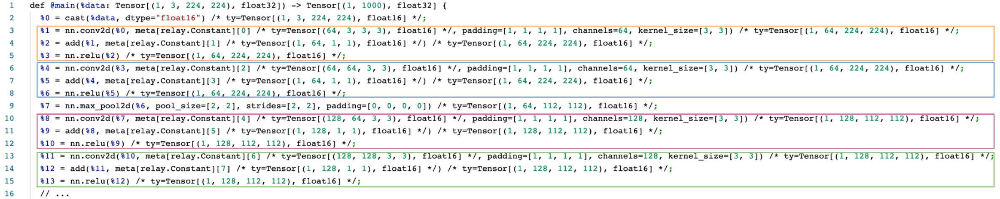

Все модели, загружаемые в TVM, конвертируются в Relay перед их оптимизацией. На рисунке выше представлен фрагмент свёрточной нейронной сети в Relay. 

Как можно видеть, модель принимает на вход данные с формой `(1, 3, 224, 224)`, а выходом является тензор, состоящий из 1000 элементов и показывающий вероятность того или иного класса на изображении. Затем начинается непосредственно описание вычислительного графа: приведение типа данных у входного тензора, затем `conv2d`, `add`, `relu` и т.д.

Во время проходов оптимизации некоторые из этих операторов будут объединены и выполнены в подграфах. Цветные прямоугольники на изображении как раз показывают каждый из этих подграфов. Операторы в прямоугольниках будут выделены в отдельные подграфы и исполнены вместе. Это позволяет значительно увеличить время выполнения нейронной сети.

# Немного о будущем: Relax

## Что такое Relax?

- Relax (Relay Next) - это новый IR уровня графа. Он предоставляет новые возможности для устранения критических проблем, выявленных сообществом TVM за годы использования и разработки компиляторов глубокого обучения.
- Request for Comment (RFC) посвящённый Relax: https://github.com/apache/tvm-rfcs/pull/89
- Репозиторий в котором ведётся разработка Relax: https://github.com/tlc-pack/relax

## Основная мотивация

- Создание унифицированного интерфейса для устранения границ абстраций TVM между IR на уровне графа, тензорными программами (TensorIR) и библиотеками времени выполнения (PackedFunc).
- Добавление поддержки и оптимизации моделей с динамическими размерами.
- Расширение возможностей оптимизаций вычислительного графа и расширение семантики для описания потока данных.

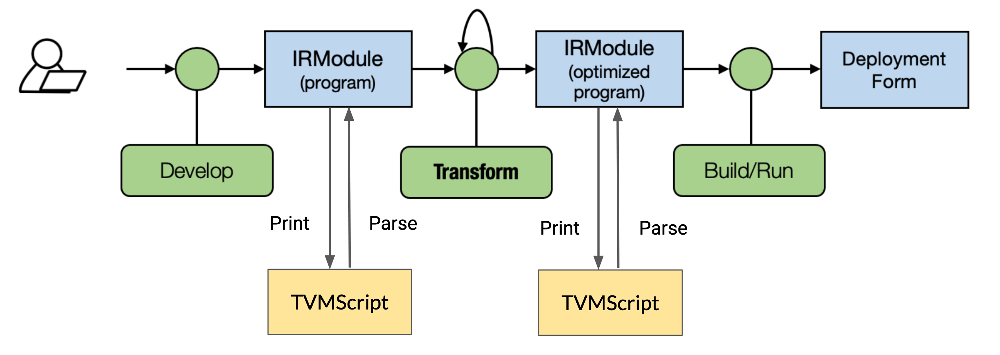

На изображении выше представлена схема работы TVM с использованием Relax. Как можно видеть теперь IR программы на всех этапах представляется ввиде описания алгоритма на TVMScript. TVMScript предоставляет дополнительные возможности для контроля за оптимизацией и компиляцией программ в TVM.

# Настройка (тюнинг) модели в TVM

## Что такое тюнинг модели в терминах TVM?

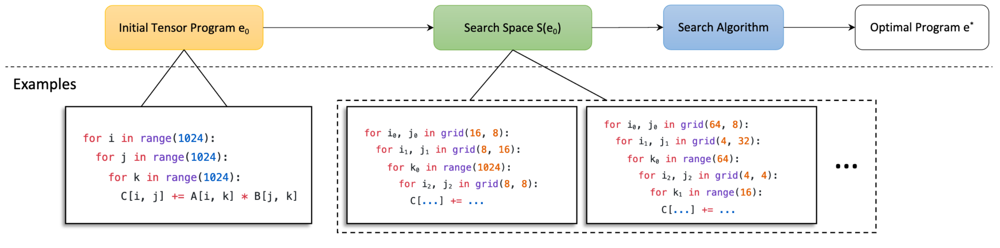

Рассмотрим, что такое настройка или тюнинг модели с точки зрения TVM. Когда мы запускаем TVM, то начальная версия программы может быть довольно простой с точки зрения кода. На рисунке выше в левой части как раз представлен пример такой программы. Там реализуется функция умножения матриц, размером `1024x1024` элементов. Когда мы запускаем тюнинг в TVM, то он начинает перебирать конфигурации из пространства поиска, замерять время выполнения сети и оставлять наилучшие варианты. В середине рисунка представлены два варианта кода, которые могут быть сгенерированы во время поиска. Алгоритм поиска перебирает различные варианты кода, а также различные параметры разбиения вычислений на циклы и находит оптимальную реализацию алгоритма для целевого устройства.

## Алгоритмы планирования в TVM

- AutoTVM: https://arxiv.org/pdf/1805.08166.pdf
- Auto-Scheduler: https://arxiv.org/pdf/2006.06762.pdf
- Meta-Scheduler: https://arxiv.org/pdf/2205.13603.pdf

В TVM есть три механизма настройки сетей: AutoTVM, Auto-Scheduler и Meta-Scheduler. AutoTVM - это первое поколение алгоритмов тюнинга в TVM. Auto-Scheduler - второе и более современное поколение. Последнее поколение на сегодняшний день - Meta-Scheduler. Meta-Scheduler сейчас всё ещё находится в стадии активной разработки, поэтому много новых улучшений и возможностей добавляются в этот алгоритм планирования. Ссылки на статьи для каждого из алгоритмов приведены выше. Далее рассмотрим эти алгоритмы.

## Обзор подходов к тюнингу. AutoTVM

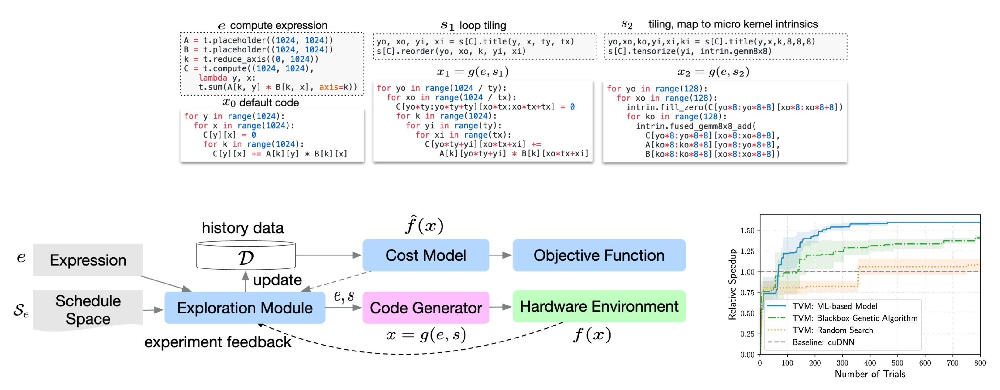

Начнём с обзора AutoTVM. AutoTVM работает с подграфами, а не просто с оператором, поэтому области поиска, с которыми он работает, довольно обширны и сложны.

AutoTVM - это алгоритм поиска, основанный на шаблонах, позволяющий найти эффективную реализацию тензорных операций. В верхней части изображения, слева, представлен код compute функции, которая вычисляет произведение матриц. На изображениях справа есть пример написания функции планирования для этой compute функции. Написание функции планирования может быть очень сложной задачей и потребовать от разработчика знаний об архитектуре целевого устройства.

В нижней части слева представлен алгоритм AutoTVM. На вход подаётся выражение и пространство поиска. AutoTVM перебирает различные конфигурации пранирования для запуска на целевом устройстве. Статистика времени выполнения собирается в базе данных `D`. Эта база используется для обновления статистической cost модели. На основе cost модели (модели затрат) производится оценка каждой низкоуровневой программы. AutoTVM измеряет фактическое время для каждой реализации, что даёт достоверные данные для обучения cost модели, чтобы предсказать, сколько времени займёт следующая реализация. Преимущество этого подхода в том, что поскольку модель обучается с использованием данных, полученных во время выполнения, то она может адаптироваться к любому типу оборудования, на котором она работает. Минус заключается в том, что требуется больше времени, чтобы модель затрат начала улучшаться.

На графике в правой части изображения, вы можете видеть ускорение, которое достигается с помощью TVM по сравнению с cuDNN для ResNet-50 на NVidia Titan X. Чтобы превзойти cuDNN, TVM на основе ML алгоритма поиска требуется около 70 испытаний.

## Обзор подходов к тюнингу. AutoTVM vs Auto-Scheduler

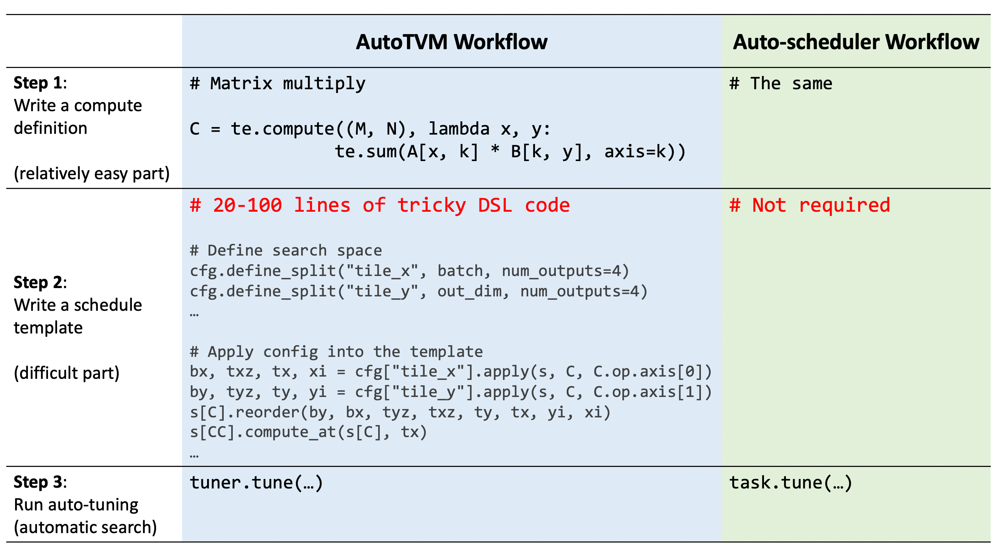

Сравним процессы генерации кода для AutoTVM и Auto-Scheduler. В первой колонке AutoTVM, а во второй Auto-Scheduler. Алгоритм AutoTVM состоит из трёх шагов:
1. Написание определения функции compute на языке тензорных выражений TVM. Это довольно просто, т.к. похоже на математическое выражение.
2. Написание шаблона расписания для планировщика. Обычно представляет собой от 20 до 100 строк довольно сложного кода, который требует знаний в особенностях аппаратной архитектуры целевого устройства, а также семантики оператора. Это довольно сложный шаг.
3. Автоматический запуск алгоритма поиска. Это шаг настройки модели.

Алгоритм Auto-Scheduler содержит те же шаги, за исключением шага №2. Таким образом, Auto-Scheduler позволяет избежать доволно сложного шага, и автоматическое построение пространства поиска позволяет исследовать гораздо больше комбинаций оптимизаций. Шаг 3 также ускоряется за счёт использования более совершенного алгоритма поиска.

## Обзор подходов к тюнингу. Auto-Scheduler (a.k.a. Ansor)

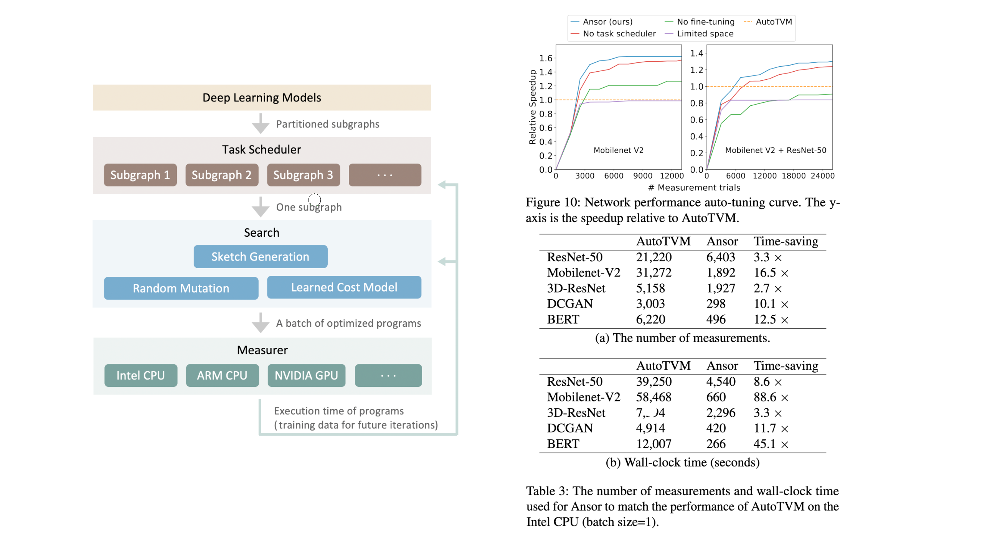

Как уже упоминалось, написание функции расписания может быть очень сложным, и для достижения максимальной эффективности требуется, чтобы шаблоны расписания были написаны специалистами, разбирающимися в архитектуре целевого устройства. В TVM только эти шаблоны занимают более 15000 сточек кода. Шаблоны AutoTVM иногда могут быть неэффективны или сильно ограничивать пространство поиска, что делает невозможным достижение оптимальной производительности с использованием этих шаблонов. 

Чтобы решить эти проблемы, было предложено второе поколение тюнинга - Auto-Scheduler. Auto-Scheduler стремится быть полностью автоматизированным для создания высокопроизводительного платформоспецифичного кода без необходимости написания шаблонов поиска руками. Auto-Scheduler может достичь более высокой производительности с меньшими затратами времени поиска и более автоматизированным способом. Этого удалось достичь благодаря инновациям в построении пространства поиска и улучшенному алгоритму поиска.

В левой части изображения выше вы можете увидеть как работает Auto-Scheduler. Модель глубокого обучения, подающаяся на вход, разбивается на небольшие подграфы. Планировщик задач используется для выделения временных ресурсов и для оптимизации множества подграфов. На каждой итерации планировщик выбирает подграф, который имеет наибольший потенциал с точки зрения повышения конечной производительности. Для этого подграфа TVM анализирует его тензорное выражение и генерирует для него несколько шаблонов. Затем TVM запускает поиск с предобученной cost моделью, чтобы получить набор оптимизированных программ. Оптимизированные программы отправляются на целевое устройство для проведения измерений. Когда измерения завершены, то результаты замеров используются в качестве обратной связи для обновления всех компонентов системы. Этот процесс повторяется до тех пор, пока оптимизация не сойдётся или мы не выйдем за пределы времени, выделенного на настройку модели.

В правой части изображения вы можете увидеть график производительности модели. Как можно видеть, Auto-Scheduler даёт значительный прирост производительности в сравнении с AutoTVM. Под изображением находятся две таблицы, которые показывают экономию времени при использовании Auto-Scheduler в сравнении с AutoTVM. В верхней таблице приводятся цифры для сравнения количества измерений, необходимых Auto-Scheduler для достижения оптимальной производительности, а в нижней - время в секундах, необходимое для достижения оптимальной производительности. Auto-Scheduler значительно превосходит AutoTVM за счёт улучшенных алгоритмов генерации пространства поиска и алгоритма поиска.

## Обзор подходов к тюнингу. Meta-Scheduler

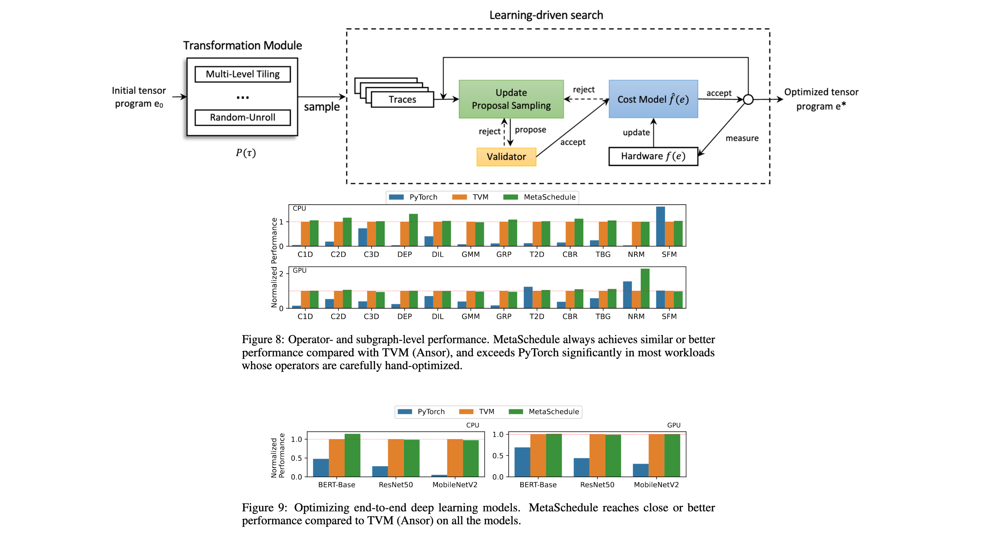

Недавно в TVM было добавлено третье поколение алгоритмов для настройки и оптимизации программ - Meta-Scheduler. Особенностью Meta-Scheduler является то, что он старается объединить в себе лучшее из обоих предыдущих поколений тюнинга. Meta-Scheduler позволяет:
1. Писать вручную трансформации на домен-специфичном языке. Это позволяет пользователю вручную написать расписание и оптимизировать программу.
2. Автоматически искать оптимальный алгоритм, основываясь на шаблонах, написанных разработчиком. По сути это тоже, что делал AutoTVM. Алгоритм полностью полагается на разработчиков для определения области поиска и перебирает варианты.
3. Строить пространство поиска с использованием алгоритма Auto-Scheduler. 

Благодаря отделению построения пространства поиска от самого поиска Meta-Scheduler предоставляет единую структуру для всех вариантов использования, которая в то же время может быть легко расширена за счёт модульной архитектуры.

Выше, в верхней части рисунка, приведён общий алгоритм Meta-Scheduler. Transformation Module содержит набор оптимизаций, которые могут применяться к данной программе и определяют пространство поиска. Набор трансформаций в Transformation Module может контролироваться пользователем и содержать различные оптимизации, от общих до платформо-специфичных.

После применения трансформаций генерируется набор трейсов, которые по факту являются последовательностью примитивов Meta-Scheduler, содержащих только инструкции на основе которых генеритуется сэмпл (пример, оптимизация, которая должна быть проверена). 

Может возникнуть такая ситуация, что сгенерированный пример не является корректным. Это может случиться, например, из-за того, что в одном из трейсов сгенерированное случайным образом значение привысит какие-либо аппаратные ограничения. Validator позволяет выполнять проверку правильности сгенерированной оптимизации и в случае каких-либо в ней проблем отклонять её.

В связи с тем, что отправка модели на устройство и проведение замеров времени исполнения там - это довольно дорогостоящая операция, то специальная Cost Model $\hat f$, обновляющаяся на протяжении всего процесса тюнинга, занимается оценкой и отсевом сгенерированного кода, который будет медленно работать.

Если код прошёл все проверки, то он отправляется на целевое устройство, на котором проводятся замеры его производительности. Эволюционный алгоритм поиска применяется на каждой новой итерации оптимизации модели и предлагает новые варианты трасс путём изменения случайных величин.

Благодаря модульности алгоритма Meta-Scheduler в него могут быть довольно легко добавлены новые шаги и алгоритмы, которые улучшат скорость и точность поиска оптимального кода.

В нижней части рисунка представлены графики сравнения производительности Meta-Scheduler в сравнении с Auto-Scheduler и PyTorch. Видно, что Meta-Scheduler демонстрирует производительность не хуже, а иногда и лучше, чем Auth-Scheduler.

## Установка необходимых зависимостей

Установим модули Python, которые могут потребоваться во время настройки моделей в TVM.

In [25]:
# If you are using Mac OSX, you should first install OpenMP library (libomp)
!pip3 install --user tornado psutil 'xgboost<1.6.0' cloudpickle

## Некоторые общие функции и переменные

- Объявим некоторые общие переменные, которые будут использоваться во всех режимах тюнинга:

In [26]:
model_name = "my_mnist_model"
input_name = "input_input"
target = tvm.target.Target("llvm -mcpu=core-avx2")

import multiprocessing
# Set number of threads used for tuning based on the number of
# physical CPU cores on your machine.
num_threads = multiprocessing.cpu_count()
print("Num threads: ", int(num_threads/2))
os.environ["TVM_NUM_THREADS"] = str(int(num_threads/2))

Num threads:  8


Определим `model_name`, его мы будем использовать для наименования файлов со статистикой. 

`input_name` - имя первого слоя в модели. 

`target` - устройство, на котором мы планируем запускать нашу модель. Указываем также, что хотим использовать векторные инструкции. 

Переменная окружения `TVM_NUM_THREADS` используется для указания TVM доступного числа потоков. Тут указывается половина от того, что есть на рабочей машине для того, чтобы не загружать её на 100%.

- Следующая функция будет использоваться для оценки времени работы модели:

In [27]:
def evaluate_performance(lib, data_shape, dtype="float32"):
    # upload parameters to device
    dev = tvm.cpu()
    data_tvm = tvm.nd.array((np.random.uniform(size=data_shape)).astype(dtype))
    module = graph_executor.GraphModule(lib["default"](dev))
    module.set_input(input_name, data_tvm)

    # evaluate
    print("Evaluate inference time cost...")
    print(module.benchmark(dev, number=100, repeat=3))

Перед тем, как рассмотреть каждый из алгоритмов тюнинга моделей на практике, необходимо определить функцию, которая будет использоваться для оценки времени работы модели.

Функция принимает три параметра:
- `lib` - модель, скомпилированная с помощью TVM.
- `data_shape` - размер входного тензора.
- `dtype` - тип входного тензора.

Замеры будем производить на cpu. Создаём входной тензор `data_tvm`, заполненный случайными данными. Затем создаётся [GraphExecutor модуль](https://tvm.apache.org/docs/reference/api/python/graph_executor.html#tvm.contrib.graph_executor.GraphModule) для запуска модели, устанавливаются значения для входного тензора и запускается функция [benchmark](https://tvm.apache.org/docs/reference/api/python/graph_executor.html#tvm.contrib.graph_executor.GraphModule.benchmark), которая запускает модель заданное число раз и вычисляет среднее время исполнения.

## AutoTVM

- Подключаем необходимые модули:

In [28]:
from tvm import autotvm

from tvm.autotvm.tuner import XGBTuner, GATuner, RandomTuner, GridSearchTuner

Рассмотрим первый из алгоритмов поиска оптимального расписания для модели - AutoTVM. Подключаем необходимые Python модули. Модуль `autotvm` содержит различные функции, которые используются для запуска настройки модели с помощью AutoTVM, а модули `XGBTuner`, `GATuner`, `RandomTuner`, `GridSearchTuner` отвечают за алгоритм поиска в пространстве оптимизаций. Подробнее про это можно почитать [здесь](https://tvm.apache.org/docs/reference/api/python/autotvm.html#module-tvm.autotvm.tuner).

- В переменной `log_file` будем хранить имя файла, в который будет записан результат тюнинга. Он будет использоваться при компиляции для получения оптимизированной модели.

In [29]:
log_file = "../Common/%s.autotvm.log" % model_name

- Определим функцию, которая будет отвечать за извлечение задач из модели:

In [30]:
# extract workloads from relay program
def extract_tasks(mod, target, params):
    print("Mod:")
    print(mod)
    print("Extract tasks...")
    tasks = autotvm.task.extract_from_program(
        mod, target=target, params=params
    )
    assert(len(tasks) > 0)
    for idx, task in enumerate(tasks):
        print("Task: %d,  workload: %s" % (idx, task.workload))
    return tasks

Для извлечения задач используется функция `autotvm.task.extract_from_program`, определённая [здесь](https://github.com/apache/tvm/blob/main/python/tvm/autotvm/task/relay_integration.py). Эта функция анализирует Relay граф и извлекает из него подграфы, на которые будет разбит граф во время исполнения, и ищет оптимальные конфигурации для этих подграфов.

- Извлечем задачи:

In [31]:
tasks = extract_tasks(mod, target, params)

Mod:
def @main(%input_input: Tensor[(1, 28, 28, 1), float32], %v_param_1: Tensor[(3, 3, 1, 64), float32], %v_param_2: Tensor[(64), float32], %v_param_3: Tensor[(3, 3, 64, 32), float32], %v_param_4: Tensor[(32), float32], %v_param_5: Tensor[(10, 18432), float32], %v_param_6: Tensor[(10), float32]) {
  %0 = nn.conv2d(%input_input, %v_param_1, padding=[0, 0, 0, 0], channels=64, kernel_size=[3, 3], data_layout="NHWC", kernel_layout="HWIO");
  %1 = nn.bias_add(%0, %v_param_2, axis=-1);
  %2 = nn.relu(%1);
  %3 = nn.conv2d(%2, %v_param_3, padding=[0, 0, 0, 0], channels=32, kernel_size=[3, 3], data_layout="NHWC", kernel_layout="HWIO");
  %4 = nn.bias_add(%3, %v_param_4, axis=-1);
  %5 = nn.relu(%4);
  %6 = nn.batch_flatten(%5);
  %7 = nn.dense(%6, %v_param_5, units=10);
  %8 = nn.bias_add(%7, %v_param_6);
  nn.softmax(%8)
}

Extract tasks...


Task: 0,  workload: ('dense_nopack.x86', ('TENSOR', (1, 18432), 'float32'), ('TENSOR', (10, 18432), 'float32'), None, 'float32')
Task: 1,  workload: ('dense_pack.x86', ('TENSOR', (1, 18432), 'float32'), ('TENSOR', (10, 18432), 'float32'), None, 'float32')


Во время извлечения задач у нас два раза отобразилось сообщение `conv2d NHWC layout is not optimized for x86 with autotvm.`. Это означает, что AutoTVM не нашёл шаблоны для оптимизации свёртки с NHWC макетом для x86 архитектуры и не сможет каким-либо образом оптимизировать этот слой. Если посмотреть на распечатанный Relay модели, то видно, что большую часть модели занимают свёрточные слои. Операции с `%0` по `%5` включительно будут объединены в 2 `conv2d` слоя, но они будут показывать посредственную производительность. Для того, чтобы заставить AutoTVM настроить и свёрточные слои, надо написать реализацию функции расписания для `conv2d NHWC` для x86. Сейчас мы этим заниматься не будем.

В результате AutoTVM нашёл только конфигурации для полносвязанного слоя и запустил настройку для двух вариантов его реализации: `dense_nopack` и `dense_pack`. Во время запуска будет выбрана та реализация, которая будет показывать наилучшую производительность.

- Определим функцию, которая будет запускать настройку модели:

In [32]:
def run_tuning(
    tasks, measure_option, tuner="gridsearch", early_stopping=None, log_filename="tuning.log"
):
    for i, task in enumerate(tasks):
        prefix = "[Task %2d/%2d] " % (i + 1, len(tasks))

        # create tuner
        if tuner == "xgb" or tuner == "xgb-rank":
            tuner_obj = XGBTuner(task, loss_type="rank")
        elif tuner == "ga":
            tuner_obj = GATuner(task, pop_size=50)
        elif tuner == "random":
            tuner_obj = RandomTuner(task)
        elif tuner == "gridsearch":
            tuner_obj = GridSearchTuner(task)
        else:
            raise ValueError("Invalid tuner: " + tuner)

        # do tuning
        n_trial = len(task.config_space)
        tuner_obj.tune(
            n_trial=n_trial,
            early_stopping=early_stopping,
            measure_option=measure_option,
            callbacks=[
                autotvm.callback.progress_bar(n_trial, prefix=prefix),
                autotvm.callback.log_to_file(log_filename),
            ],
        )

AutoTVM позволяет выбрать между несколькими из различных тюнеров. Подробнее про каждый из них можно почитать на [страничке с документацией](https://tvm.apache.org/docs/reference/api/python/autotvm.html?highlight=xgbtuner#module-tvm.autotvm.tuner). Затем устанавливаем значение `n_trial`, определяющее максимальное число конфигураций, которые будут пробоваться для каждой из задач. Мы никак не будем его ограничивать и пройдёмся по всем задачам во время настройки. В случае, если число возможных конфигураций слишком большое, то их число можно ограничить.

Затем вызывается функция `tune`, которая и запускает непосредственно тюнинг. Туда передаётся описанный выше `n_trial`, переменная `early_stopping`, отвечающая за остановку тюнинга, если не получается больше найти оптимальные конфигурации. Настройки замера `measure_option` отвечает за то, как проводятся замеры генерируемого кода. В `callbacks` передаются функции, отвечающие за запись конфигураций в файл с логами и за отображение строки состояния тюнинга. Подробнее можно почитать [здесь](https://tvm.apache.org/docs/reference/api/python/autotvm.html?highlight=xgbtuner#tvm.autotvm.tuner.Tuner.tune).

- Определим настройки замера:

In [33]:
measure_option = autotvm.measure_option(
    builder=autotvm.LocalBuilder(),
    runner=autotvm.LocalRunner(repeat=10, enable_cpu_cache_flush=True),
)

`measure_option` определяет то, как генерируемый код будет строиться и запускаться. Например, под хост (машинку, на которой запущен тюнинг) или же под удалённое устройство, подключенное к TVM через RPC. Документация по `measure_option` есть [здесь](https://tvm.apache.org/docs/reference/api/python/autotvm.html?highlight=xgbtuner#tvm.autotvm.measure.measure_option). Мы создаём [LocalBuilder](https://tvm.apache.org/docs/reference/api/python/autotvm.html?highlight=xgbtuner#tvm.autotvm.measure.measure_methods.LocalBuilder), который запускает компиляцию на локальной машине, и [LocalRunner](https://tvm.apache.org/docs/reference/api/python/autotvm.html?highlight=xgbtuner#tvm.autotvm.measure.measure_methods.LocalRunner), который запускает сгенерированный код на локальной машине. В `LocalRunner` мы также передаём опции, отвечающие за то, сколько раз и как запускать задачу во время замеров производительности.

- Запускаем тюнинг:

In [34]:
# run tuning tasks
run_tuning(tasks, measure_option, tuner="xgb", log_filename=log_file)

[Task  1/ 2]  Current/Best:    0.00/   0.00 GFLOPS | Progress: (0/144) | 0.00 s

/Users/echuraev/.local/lib/python3.10/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
2023-02-10 11:52:37.475 INFO Finish serving ('127.0.0.1', 63320)
2023-02-10 11:52:38.414 INFO Finish serving ('127.0.0.1', 63327)
2023-02-10 11:52:57.877 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpaafhrb9d/tmp_func_8a6183f5abe176d2.tar
2023-02-10 11:52:58.006 INFO Finish serving ('127.0.0.1', 63414)
2023-02-10 11:52:59.181 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp0g5n790r/tmp_func_4eb25169b461c6ca.tar
2023-02-10 11:52:59.314 INFO Finish serving ('127.0.0.1', 63424)
2023-02-10 11:53:00.476 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp4src88lo/tmp_func_722ae1c2c24ec2af.tar
2023-02-10 11:53:00.611 INFO Finish serving ('127.0.0.1', 63435)
2023-02-

[Task  1/ 2]  Current/Best:    9.47/  23.84 GFLOPS | Progress: (16/144) | 39.34 s

2023-02-10 11:53:13.469 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpxg1mgiz7/tmp_func_b3a12de9f0b62cb3.tar
2023-02-10 11:53:13.601 INFO Finish serving ('127.0.0.1', 63483)
2023-02-10 11:53:25.432 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpt2lc_ecq/tmp_func_f65bee26c387ec8.tar
2023-02-10 11:53:25.566 INFO Finish serving ('127.0.0.1', 63539)
2023-02-10 11:53:26.735 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp0fch1vcn/tmp_func_6eaba0a530d42f8b.tar
2023-02-10 11:53:26.868 INFO Finish serving ('127.0.0.1', 63561)
2023-02-10 11:53:28.174 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp8z23w5h7/tmp_func_afff6f80e84f77a.tar
2023-02-10 11:53:28.307 INFO Finish serving ('127.0.0.1', 63567)
2023-02-10 11:53:29.634 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpupzl4aj3/tmp_func_7e3948985383ba76.tar
2023-02-10 11:53:29.767 INFO Finish serving ('127.0.0.1', 63577)
2023-02-10 11:53:

[Task  1/ 2]  Current/Best:    4.41/  29.48 GFLOPS | Progress: (32/144) | 70.87 s

2023-02-10 11:53:45.001 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpo7gapjic/tmp_func_838ce0058b20a3f5.tar
2023-02-10 11:53:45.136 INFO Finish serving ('127.0.0.1', 63645)
2023-02-10 11:53:52.895 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpcz1070yu/tmp_func_c14a8bdc967bedb7.tar
2023-02-10 11:53:53.032 INFO Finish serving ('127.0.0.1', 63669)
2023-02-10 11:53:54.388 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpbmdto8_z/tmp_func_8e288b09bc04a08a.tar
2023-02-10 11:53:54.522 INFO Finish serving ('127.0.0.1', 63677)
2023-02-10 11:53:55.936 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp4vktt5tz/tmp_func_7cb9190a7ac799a9.tar
2023-02-10 11:53:56.069 INFO Finish serving ('127.0.0.1', 63683)
2023-02-10 11:53:57.504 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmptp1b_6nq/tmp_func_30c83f757b8bf61.tar
2023-02-10 11:53:57.634 INFO Finish serving ('127.0.0.1', 63696)
2023-02-10 11:53

[Task  1/ 2]  Current/Best:    2.48/  31.37 GFLOPS | Progress: (48/144) | 102.13 s

2023-02-10 11:54:16.254 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpgy56jish/tmp_func_872a728a6c38ad42.tar
2023-02-10 11:54:16.393 INFO Finish serving ('127.0.0.1', 63831)
2023-02-10 11:54:27.788 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmppyeq3ine/tmp_func_70ce56aca2a72e20.tar
2023-02-10 11:54:27.923 INFO Finish serving ('127.0.0.1', 63865)
2023-02-10 11:54:29.229 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp9uk2fa_f/tmp_func_f19fd9a39a9d37cb.tar
2023-02-10 11:54:29.363 INFO Finish serving ('127.0.0.1', 63873)
2023-02-10 11:54:30.562 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpowdgiy4w/tmp_func_2e89b638a59db7fd.tar
2023-02-10 11:54:30.694 INFO Finish serving ('127.0.0.1', 63879)
2023-02-10 11:54:31.980 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpstq1vvtf/tmp_func_ae0a63b6d15a79c4.tar
2023-02-10 11:54:32.116 INFO Finish serving ('127.0.0.1', 63885)
2023-02-10 11:5

[Task  1/ 2]  Current/Best:    7.73/  31.37 GFLOPS | Progress: (64/144) | 138.00 s

2023-02-10 11:54:56.275 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmprrmxq3gm/tmp_func_2d7564d02dc736b7.tar
2023-02-10 11:54:56.403 INFO Finish serving ('127.0.0.1', 63998)
2023-02-10 11:54:57.805 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmppg2fa2qc/tmp_func_a712cae11e351627.tar
2023-02-10 11:54:57.938 INFO Finish serving ('127.0.0.1', 64006)
2023-02-10 11:54:59.386 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmplss6zk9n/tmp_func_a195c2f175e5733d.tar
2023-02-10 11:54:59.519 INFO Finish serving ('127.0.0.1', 64014)
2023-02-10 11:55:00.833 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp54cuallu/tmp_func_f5d8456eff4213cf.tar
2023-02-10 11:55:00.964 INFO Finish serving ('127.0.0.1', 64018)
2023-02-10 11:55:02.389 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpp6w90ok8/tmp_func_b47fb285ff67fad.tar
2023-02-10 11:55:02.519 INFO Finish serving ('127.0.0.1', 64024)
2023-02-10 11:55

[Task  1/ 2]  Current/Best:   12.82/  31.37 GFLOPS | Progress: (80/144) | 163.99 s

2023-02-10 11:55:18.119 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpahr926f_/tmp_func_d18dbf9e26906183.tar
2023-02-10 11:55:18.250 INFO Finish serving ('127.0.0.1', 64113)
2023-02-10 11:55:22.706 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpmnex3n20/tmp_func_8bd1c01976b3156.tar
2023-02-10 11:55:22.837 INFO Finish serving ('127.0.0.1', 64128)
2023-02-10 11:55:24.013 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpdqngkxxf/tmp_func_3d265bffc1747e75.tar
2023-02-10 11:55:24.147 INFO Finish serving ('127.0.0.1', 64135)
2023-02-10 11:55:25.459 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpmmn9jqwr/tmp_func_57b09b1d49f969c1.tar
2023-02-10 11:55:25.592 INFO Finish serving ('127.0.0.1', 64142)
2023-02-10 11:55:26.802 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpx0j4uimb/tmp_func_80e977dfa34712d3.tar
2023-02-10 11:55:26.934 INFO Finish serving ('127.0.0.1', 64147)
2023-02-10 11:55

[Task  1/ 2]  Current/Best:   10.43/  31.37 GFLOPS | Progress: (96/144) | 190.60 s

2023-02-10 11:55:44.727 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp5u0dcfic/tmp_func_93c741d5b421cde.tar
2023-02-10 11:55:44.859 INFO Finish serving ('127.0.0.1', 64232)
2023-02-10 11:55:56.267 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmppl7i0rtf/tmp_func_7b888bf6a8b51272.tar
2023-02-10 11:55:56.407 INFO Finish serving ('127.0.0.1', 64308)
2023-02-10 11:55:57.570 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpuqf8ti1x/tmp_func_e3eb861b1b8e2db.tar
2023-02-10 11:55:57.704 INFO Finish serving ('127.0.0.1', 64315)
2023-02-10 11:55:59.013 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp0dbrnigr/tmp_func_aa608f0005415a61.tar
2023-02-10 11:55:59.149 INFO Finish serving ('127.0.0.1', 64320)
2023-02-10 11:56:00.456 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpax97hfy_/tmp_func_b6df844f355b2bdd.tar
2023-02-10 11:56:00.589 INFO Finish serving ('127.0.0.1', 64327)
2023-02-10 11:56:

[Task  1/ 2]  Current/Best:    1.76/  31.37 GFLOPS | Progress: (112/144) | 218.65 s

2023-02-10 11:56:12.772 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmptlk1gzyv/tmp_func_fd9933eb794da691.tar
2023-02-10 11:56:12.913 INFO Finish serving ('127.0.0.1', 64396)
2023-02-10 11:56:27.460 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp34rcamo8/tmp_func_e3c8479d01a475cc.tar
2023-02-10 11:56:27.595 INFO Finish serving ('127.0.0.1', 64464)
2023-02-10 11:56:29.092 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpicu6u9js/tmp_func_a9e4042283645994.tar
2023-02-10 11:56:29.227 INFO Finish serving ('127.0.0.1', 64471)
2023-02-10 11:56:30.599 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp1nvatylg/tmp_func_47bea6d7db7f65a4.tar
2023-02-10 11:56:30.733 INFO Finish serving ('127.0.0.1', 64479)
2023-02-10 11:56:32.042 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp7yif0efm/tmp_func_f41c6ca3a2a5c6d2.tar
2023-02-10 11:56:32.178 INFO Finish serving ('127.0.0.1', 64485)
2023-02-10 11:5

[Task  1/ 2]  Current/Best:    6.50/  31.37 GFLOPS | Progress: (128/144) | 249.52 s

2023-02-10 11:56:57.869 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpi02phxtb/tmp_func_a1c8fd0c362aa4d4.tar
2023-02-10 11:56:58.003 INFO Finish serving ('127.0.0.1', 64591)
2023-02-10 11:56:59.197 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpx9x5ktgw/tmp_func_ba1442d533574d62.tar
2023-02-10 11:56:59.336 INFO Finish serving ('127.0.0.1', 64597)
2023-02-10 11:57:00.484 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpbgbv7s77/tmp_func_4956f982401f7958.tar
2023-02-10 11:57:00.612 INFO Finish serving ('127.0.0.1', 64604)
2023-02-10 11:57:02.061 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpmju55ly6/tmp_func_b6401a9c51f780f1.tar
2023-02-10 11:57:02.195 INFO Finish serving ('127.0.0.1', 64608)
2023-02-10 11:57:03.500 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpksgwt4gq/tmp_func_fd9ec349dbe2096b.tar
2023-02-10 11:57:03.635 INFO Finish serving ('127.0.0.1', 64615)
2023-02-10 11:5

[Task  1/ 2]  Current/Best:    1.58/  31.37 GFLOPS | Progress: (144/144) | 273.83 s

2023-02-10 11:57:07.954 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpvl8l0q8o/tmp_func_f790c654d7d90b46.tar
2023-02-10 11:57:08.093 INFO Finish serving ('127.0.0.1', 64632)


[Task  2/ 2]  Current/Best:    0.00/   0.00 GFLOPS | Progress: (0/324) | 0.00 s

2023-02-10 11:57:10.855 INFO Finish serving ('127.0.0.1', 64644)
2023-02-10 11:57:11.767 INFO Finish serving ('127.0.0.1', 64648)
2023-02-10 11:57:26.049 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpd4td_0so/tmp_func_5e5b1f439667ca98.tar
2023-02-10 11:57:26.183 INFO Finish serving ('127.0.0.1', 64692)
2023-02-10 11:57:27.483 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpadazf_rd/tmp_func_1cbe21eda2a79928.tar
2023-02-10 11:57:27.623 INFO Finish serving ('127.0.0.1', 64706)
2023-02-10 11:57:28.894 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpbxf3co90/tmp_func_698ae993923be22f.tar
2023-02-10 11:57:29.027 INFO Finish serving ('127.0.0.1', 64712)
2023-02-10 11:57:30.370 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpqxbts9mf/tmp_func_9acc7b116672dbad.tar
2023-02-10 11:57:30.508 INFO Finish serving ('127.0.0.1', 64719)
2023-02-10 11:57:32.529 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0

[Task  2/ 2]  Current/Best:   11.19/  12.35 GFLOPS | Progress: (16/324) | 35.92 s

2023-02-10 11:57:44.058 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpjvxrfgqd/tmp_func_2a731029ee4a3238.tar
2023-02-10 11:57:44.196 INFO Finish serving ('127.0.0.1', 64797)
2023-02-10 11:57:57.502 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpvlm086e9/tmp_func_6d9e1fed1a5871ad.tar
2023-02-10 11:57:57.639 INFO Finish serving ('127.0.0.1', 64891)
2023-02-10 11:57:58.772 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmphmmavusc/tmp_func_e1f1f164e925b6f9.tar
2023-02-10 11:57:58.905 INFO Finish serving ('127.0.0.1', 64895)
2023-02-10 11:58:00.122 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpzwl7xx2y/tmp_func_a0d96c1db9d942f9.tar
2023-02-10 11:58:00.251 INFO Finish serving ('127.0.0.1', 64901)
2023-02-10 11:58:01.387 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpb_thzmg8/tmp_func_4380f9614ae64bff.tar
2023-02-10 11:58:01.528 INFO Finish serving ('127.0.0.1', 64906)
2023-02-10 11:5

[Task  2/ 2]  Current/Best:   10.68/  12.35 GFLOPS | Progress: (32/324) | 65.09 s

2023-02-10 11:58:13.231 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpsxhm97xz/tmp_func_6e8eba2d91ec95a6.tar
2023-02-10 11:58:13.369 INFO Finish serving ('127.0.0.1', 64948)
2023-02-10 11:58:27.257 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpiftsh3mt/tmp_func_4f3ef16a8c398ede.tar
2023-02-10 11:58:27.397 INFO Finish serving ('127.0.0.1', 64993)
2023-02-10 11:58:28.569 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp2ckqtbsc/tmp_func_73d0477c19494ed3.tar
2023-02-10 11:58:28.707 INFO Finish serving ('127.0.0.1', 65005)
2023-02-10 11:58:30.005 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp3en__8hs/tmp_func_3b9f8ac7535bfee4.tar
2023-02-10 11:58:30.147 INFO Finish serving ('127.0.0.1', 65009)
2023-02-10 11:58:31.269 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpiqrwoz9m/tmp_func_c9fff6844424505e.tar
2023-02-10 11:58:31.411 INFO Finish serving ('127.0.0.1', 65015)
2023-02-10 11:5

[Task  2/ 2]  Current/Best:    1.58/  12.35 GFLOPS | Progress: (48/324) | 93.11 s

2023-02-10 11:58:41.242 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpvfh2d12n/tmp_func_7dc710f1bbb0c747.tar
2023-02-10 11:58:41.386 INFO Finish serving ('127.0.0.1', 65058)
2023-02-10 11:58:55.306 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpok_eyclr/tmp_func_d3246c7a6c823883.tar
2023-02-10 11:58:55.448 INFO Finish serving ('127.0.0.1', 65110)
2023-02-10 11:58:56.639 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp_h2s3ws_/tmp_func_1221fa810eb7913c.tar
2023-02-10 11:58:56.779 INFO Finish serving ('127.0.0.1', 65118)
2023-02-10 11:58:57.966 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp17sxcpuq/tmp_func_9b3fd7d83614f873.tar
2023-02-10 11:58:58.104 INFO Finish serving ('127.0.0.1', 65138)
2023-02-10 11:58:59.366 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmphzyd4hgz/tmp_func_f91702134224098f.tar
2023-02-10 11:58:59.498 INFO Finish serving ('127.0.0.1', 65146)
2023-02-10 11:5

 Done.
[Task  2/ 2]  Current/Best:    7.09/  12.35 GFLOPS | Progress: (64/324) | 129.77 s

2023-02-10 11:59:24.243 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpc9vsrdn8/tmp_func_c7db32fd8cc47899.tar
2023-02-10 11:59:24.377 INFO Finish serving ('127.0.0.1', 65253)
2023-02-10 11:59:25.714 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp5rrm5l7k/tmp_func_1c69c7daaad98c98.tar
2023-02-10 11:59:25.851 INFO Finish serving ('127.0.0.1', 65258)
2023-02-10 11:59:27.157 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpgyeqke3u/tmp_func_2062cf21e232755.tar
2023-02-10 11:59:27.296 INFO Finish serving ('127.0.0.1', 65265)
2023-02-10 11:59:28.727 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmptyf02udn/tmp_func_dd20eabb7bc0fecf.tar
2023-02-10 11:59:28.864 INFO Finish serving ('127.0.0.1', 65273)
2023-02-10 11:59:30.165 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpkmnb2puj/tmp_func_4391bb157ca24b4d.tar
2023-02-10 11:59:30.302 INFO Finish serving ('127.0.0.1', 65278)
2023-02-10 11:59

[Task  2/ 2]  Current/Best:   10.14/  12.98 GFLOPS | Progress: (80/324) | 157.76 s

2023-02-10 11:59:45.900 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp2msnlfog/tmp_func_ca605124b5e042.tar
2023-02-10 11:59:46.041 INFO Finish serving ('127.0.0.1', 65330)
2023-02-10 11:59:51.290 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpem7oobx8/tmp_func_5d29994c8787e7fc.tar
2023-02-10 11:59:51.428 INFO Finish serving ('127.0.0.1', 65348)
2023-02-10 11:59:52.603 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp165rysxn/tmp_func_62f0505919147adb.tar
2023-02-10 11:59:52.735 INFO Finish serving ('127.0.0.1', 65354)
2023-02-10 11:59:54.028 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp9jxf2que/tmp_func_44affca88d318dc7.tar
2023-02-10 11:59:54.168 INFO Finish serving ('127.0.0.1', 65359)
2023-02-10 11:59:55.473 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpimvly7xn/tmp_func_f317d2374e823d6c.tar
2023-02-10 11:59:55.608 INFO Finish serving ('127.0.0.1', 65383)
2023-02-10 11:59:

[Task  2/ 2]  Current/Best:   14.37/  14.37 GFLOPS | Progress: (96/324) | 184.85 s

2023-02-10 12:00:12.991 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp6pnsmsu4/tmp_func_6dae27b48a8764c5.tar
2023-02-10 12:00:13.128 INFO Finish serving ('127.0.0.1', 65486)
2023-02-10 12:00:16.181 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmptinulxc8/tmp_func_7ea175f95f0c6d16.tar
2023-02-10 12:00:16.318 INFO Finish serving ('127.0.0.1', 65511)
2023-02-10 12:00:17.729 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp4rwb1ntp/tmp_func_1b73d3b1487a9d52.tar
2023-02-10 12:00:17.870 INFO Finish serving ('127.0.0.1', 65517)
2023-02-10 12:00:19.195 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp01blw7z1/tmp_func_ca30746d573a38bf.tar
2023-02-10 12:00:19.330 INFO Finish serving ('127.0.0.1', 65525)
2023-02-10 12:00:20.634 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpk1u2fhj8/tmp_func_343d21d909e0379a.tar
2023-02-10 12:00:20.773 INFO Finish serving ('127.0.0.1', 65529)
2023-02-10 12:0

[Task  2/ 2]  Current/Best:    9.96/  14.37 GFLOPS | Progress: (112/324) | 209.79 s

2023-02-10 12:00:37.933 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpvrs0jlp2/tmp_func_71638a2bed8c3704.tar
2023-02-10 12:00:38.071 INFO Finish serving ('127.0.0.1', 49226)
2023-02-10 12:00:43.338 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp01869fnz/tmp_func_e665f154d96be7b.tar
2023-02-10 12:00:43.475 INFO Finish serving ('127.0.0.1', 49244)
2023-02-10 12:00:44.753 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp1k9biikw/tmp_func_7a4b01166efbe6ff.tar
2023-02-10 12:00:44.891 INFO Finish serving ('127.0.0.1', 49247)
2023-02-10 12:00:46.514 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpa46un_ag/tmp_func_79babde4707908e7.tar
2023-02-10 12:00:46.647 INFO Finish serving ('127.0.0.1', 49253)
2023-02-10 12:00:47.911 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmppssk70h7/tmp_func_2d39634e170d26fe.tar
2023-02-10 12:00:48.047 INFO Finish serving ('127.0.0.1', 49260)
2023-02-10 12:00

[Task  2/ 2]  Current/Best:    2.96/  14.37 GFLOPS | Progress: (128/324) | 242.93 s

2023-02-10 12:01:22.691 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpho_glnz6/tmp_func_6c78a31402d29736.tar
2023-02-10 12:01:22.824 INFO Finish serving ('127.0.0.1', 49435)
2023-02-10 12:01:24.227 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp6k8zj83h/tmp_func_9e2dc8f8d9e70280.tar
2023-02-10 12:01:24.367 INFO Finish serving ('127.0.0.1', 49439)
2023-02-10 12:01:25.653 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpek99j8h4/tmp_func_defacdd5c9840a01.tar
2023-02-10 12:01:25.794 INFO Finish serving ('127.0.0.1', 49446)
2023-02-10 12:01:27.221 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp2atz9tk0/tmp_func_87343bcf28881585.tar
2023-02-10 12:01:27.355 INFO Finish serving ('127.0.0.1', 49452)
2023-02-10 12:01:28.663 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp_kwb_ao1/tmp_func_eb02a682e5c44fd0.tar
2023-02-10 12:01:28.803 INFO Finish serving ('127.0.0.1', 49474)
2023-02-10 12:0

[Task  2/ 2]  Current/Best:    3.43/  14.37 GFLOPS | Progress: (144/324) | 275.24 s

2023-02-10 12:01:43.377 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpq5azpp5u/tmp_func_bb3238004eb6e150.tar
2023-02-10 12:01:43.513 INFO Finish serving ('127.0.0.1', 49534)
2023-02-10 12:01:57.767 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpjmyc465d/tmp_func_7ea09cd970538eb3.tar
2023-02-10 12:01:57.920 INFO Finish serving ('127.0.0.1', 49583)
2023-02-10 12:01:59.414 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpa71gwukh/tmp_func_affc75a0940fd7e3.tar
2023-02-10 12:01:59.559 INFO Finish serving ('127.0.0.1', 49591)
2023-02-10 12:02:01.015 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmppp285eqr/tmp_func_553c341ed2345d.tar
2023-02-10 12:02:01.154 INFO Finish serving ('127.0.0.1', 49599)
2023-02-10 12:02:02.873 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp65kx3ntj/tmp_func_8755b2e8ce95a66f.tar
2023-02-10 12:02:03.022 INFO Finish serving ('127.0.0.1', 49606)
2023-02-10 12:02:

[Task  2/ 2]  Current/Best:    6.67/  14.37 GFLOPS | Progress: (160/324) | 303.12 s

2023-02-10 12:02:11.257 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmptfp1vm61/tmp_func_f7cfa4d4c1a95feb.tar
2023-02-10 12:02:11.398 INFO Finish serving ('127.0.0.1', 49642)
2023-02-10 12:02:26.330 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpktckjygl/tmp_func_d425f1eed041767c.tar
2023-02-10 12:02:26.482 INFO Finish serving ('127.0.0.1', 49702)
2023-02-10 12:02:28.170 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpa0qb9r56/tmp_func_a5b7404927774cd5.tar
2023-02-10 12:02:28.310 INFO Finish serving ('127.0.0.1', 49707)
2023-02-10 12:02:29.833 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp1z3fid3s/tmp_func_4d93c5c0e90ddc8.tar
2023-02-10 12:02:29.975 INFO Finish serving ('127.0.0.1', 49729)
2023-02-10 12:02:31.463 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpfmyzoh2u/tmp_func_7555a6d82480ffd6.tar
2023-02-10 12:02:31.598 INFO Finish serving ('127.0.0.1', 49745)
2023-02-10 12:02

[Task  2/ 2]  Current/Best:    5.96/  14.37 GFLOPS | Progress: (176/324) | 333.21 s

2023-02-10 12:02:41.353 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpjhvz2bty/tmp_func_80b8a952c6859a25.tar
2023-02-10 12:02:41.489 INFO Finish serving ('127.0.0.1', 49779)
2023-02-10 12:02:56.878 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpjgm_rh1s/tmp_func_ab790baf6def2ab9.tar
2023-02-10 12:02:57.021 INFO Finish serving ('127.0.0.1', 49870)
2023-02-10 12:02:59.691 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpp9gxwz_m/tmp_func_40285cc0ee04557e.tar
2023-02-10 12:02:59.845 INFO Finish serving ('127.0.0.1', 49876)
2023-02-10 12:03:02.315 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp5xfbsqxq/tmp_func_b45fa317010753c7.tar
2023-02-10 12:03:02.452 INFO Finish serving ('127.0.0.1', 49890)
2023-02-10 12:03:05.493 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp709ugvuc/tmp_func_16e58b39e76524e2.tar
2023-02-10 12:03:05.649 INFO Finish serving ('127.0.0.1', 49896)
2023-02-10 12:0

[Task  2/ 2]  Current/Best:    8.59/  14.37 GFLOPS | Progress: (192/324) | 378.35 s

2023-02-10 12:03:39.012 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpilkkl8vj/tmp_func_bc6c9d43d11eeb5.tar
2023-02-10 12:03:39.149 INFO Finish serving ('127.0.0.1', 50060)
2023-02-10 12:03:41.048 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmprfb9x08h/tmp_func_c22c0872bbc79d24.tar
2023-02-10 12:03:41.189 INFO Finish serving ('127.0.0.1', 50070)
2023-02-10 12:03:42.880 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpcd05cuxt/tmp_func_b62c101f78cacfa3.tar
2023-02-10 12:03:43.021 INFO Finish serving ('127.0.0.1', 50078)
2023-02-10 12:03:44.719 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp4g4m7v3z/tmp_func_aa3d0beee265a187.tar
2023-02-10 12:03:44.858 INFO Finish serving ('127.0.0.1', 50087)
2023-02-10 12:03:46.452 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpa5a2y4nb/tmp_func_82e87fb777f2c683.tar
2023-02-10 12:03:46.590 INFO Finish serving ('127.0.0.1', 50093)
2023-02-10 12:03

[Task  2/ 2]  Current/Best:    7.17/  14.37 GFLOPS | Progress: (208/324) | 414.79 s

2023-02-10 12:04:02.939 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp4qs6k4n0/tmp_func_58cdb522343aa597.tar
2023-02-10 12:04:03.070 INFO Finish serving ('127.0.0.1', 50181)
2023-02-10 12:04:10.446 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpjlpn_7t9/tmp_func_b8b07f127d2ee279.tar
2023-02-10 12:04:10.579 INFO Finish serving ('127.0.0.1', 50220)
2023-02-10 12:04:11.998 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpnzsi91rx/tmp_func_42c1c36405fe15f9.tar
2023-02-10 12:04:12.131 INFO Finish serving ('127.0.0.1', 50228)
2023-02-10 12:04:13.460 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpalwgnwbi/tmp_func_3a3f2d6f40492b9.tar
2023-02-10 12:04:13.591 INFO Finish serving ('127.0.0.1', 50234)
2023-02-10 12:04:14.993 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpazq3mowq/tmp_func_ea4296731bf5e2a6.tar
2023-02-10 12:04:15.124 INFO Finish serving ('127.0.0.1', 50240)
2023-02-10 12:04

[Task  2/ 2]  Current/Best:    1.51/  14.37 GFLOPS | Progress: (224/324) | 445.35 s

2023-02-10 12:04:33.486 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpjqslyn8d/tmp_func_445beec75d6a52f3.tar
2023-02-10 12:04:33.625 INFO Finish serving ('127.0.0.1', 50318)
2023-02-10 12:04:45.625 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpcsf07tiu/tmp_func_865b0d5e51386ae2.tar
2023-02-10 12:04:45.779 INFO Finish serving ('127.0.0.1', 50355)
2023-02-10 12:04:48.093 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpyj03071b/tmp_func_35add90aedf1372a.tar
2023-02-10 12:04:48.238 INFO Finish serving ('127.0.0.1', 50363)
2023-02-10 12:04:49.832 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpi2dhj3xb/tmp_func_b4eb1f9ca593805c.tar
2023-02-10 12:04:49.975 INFO Finish serving ('127.0.0.1', 50373)
2023-02-10 12:04:51.692 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp2fz3ctba/tmp_func_7b05fb4eab82d167.tar
2023-02-10 12:04:51.833 INFO Finish serving ('127.0.0.1', 50380)
2023-02-10 12:0

[Task  2/ 2]  Current/Best:    2.64/  14.37 GFLOPS | Progress: (240/324) | 470.89 s

2023-02-10 12:04:59.034 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp6b3xi7vz/tmp_func_78cc3b03a0acc0ca.tar
2023-02-10 12:04:59.171 INFO Finish serving ('127.0.0.1', 50439)
2023-02-10 12:05:15.158 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp7nb_nxuj/tmp_func_f9522b914f9876a5.tar
2023-02-10 12:05:15.307 INFO Finish serving ('127.0.0.1', 50549)
2023-02-10 12:05:17.250 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp36jc0irb/tmp_func_c40b2432273d35cc.tar
2023-02-10 12:05:17.393 INFO Finish serving ('127.0.0.1', 50560)
2023-02-10 12:05:19.217 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpipyui5mu/tmp_func_10d42c81115bec36.tar
2023-02-10 12:05:19.369 INFO Finish serving ('127.0.0.1', 50568)
2023-02-10 12:05:21.209 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpxycjwzf6/tmp_func_db71f2123e70e6e2.tar
2023-02-10 12:05:21.358 INFO Finish serving ('127.0.0.1', 50576)
2023-02-10 12:0

[Task  2/ 2]  Current/Best:    2.51/  14.37 GFLOPS | Progress: (256/324) | 503.34 s

2023-02-10 12:05:46.747 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpedj1czr9/tmp_func_8887a68895757cdf.tar
2023-02-10 12:05:46.883 INFO Finish serving ('127.0.0.1', 50646)
2023-02-10 12:05:48.488 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpps2ly181/tmp_func_720f961ca849d9e1.tar
2023-02-10 12:05:48.630 INFO Finish serving ('127.0.0.1', 50652)
2023-02-10 12:05:50.546 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmptsnzy3fs/tmp_func_a85c1b29388a1131.tar
2023-02-10 12:05:50.686 INFO Finish serving ('127.0.0.1', 50671)
2023-02-10 12:05:52.226 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpd7c4x58t/tmp_func_a1941481cdd6cbc5.tar
2023-02-10 12:05:52.363 INFO Finish serving ('127.0.0.1', 50700)
2023-02-10 12:05:54.093 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp6psqbejb/tmp_func_84185bab6e6e09c5.tar
2023-02-10 12:05:54.238 INFO Finish serving ('127.0.0.1', 50707)
2023-02-10 12:0

[Task  2/ 2]  Current/Best:    1.49/  14.37 GFLOPS | Progress: (272/324) | 536.05 s

2023-02-10 12:06:04.182 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpzfmtdlbg/tmp_func_4aa9d0cd0bdaffb6.tar
2023-02-10 12:06:04.325 INFO Finish serving ('127.0.0.1', 50770)
2023-02-10 12:06:19.302 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpw0s1gocx/tmp_func_47995a7ad842ec8c.tar
2023-02-10 12:06:19.443 INFO Finish serving ('127.0.0.1', 50831)
2023-02-10 12:06:20.973 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp3ukxb3_w/tmp_func_2ad42dc159d10c22.tar
2023-02-10 12:06:21.114 INFO Finish serving ('127.0.0.1', 50839)
2023-02-10 12:06:22.921 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp63f353vx/tmp_func_b9aa9a2b263d0987.tar
2023-02-10 12:06:23.065 INFO Finish serving ('127.0.0.1', 50847)
2023-02-10 12:06:24.630 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp5pr1h9sd/tmp_func_b09577776d90f10e.tar
2023-02-10 12:06:24.772 INFO Finish serving ('127.0.0.1', 50854)
2023-02-10 12:0

[Task  2/ 2]  Current/Best:    2.92/  14.37 GFLOPS | Progress: (288/324) | 564.93 s

2023-02-10 12:06:33.071 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpd7osrvcr/tmp_func_55909501141b07a7.tar
2023-02-10 12:06:33.209 INFO Finish serving ('127.0.0.1', 50907)
2023-02-10 12:06:48.269 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmplrohc_1m/tmp_func_4243db84bd5f21ce.tar
2023-02-10 12:06:48.410 INFO Finish serving ('127.0.0.1', 50973)
2023-02-10 12:06:50.185 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpnoehehot/tmp_func_9cd26b80ab9cc090.tar
2023-02-10 12:06:50.330 INFO Finish serving ('127.0.0.1', 50981)
2023-02-10 12:06:51.915 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp6ip4nz1l/tmp_func_51f56cd48acbe276.tar
2023-02-10 12:06:52.062 INFO Finish serving ('127.0.0.1', 50989)
2023-02-10 12:06:53.722 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpgrllmt8w/tmp_func_9158199321bddb4f.tar
2023-02-10 12:06:53.868 INFO Finish serving ('127.0.0.1', 50997)
2023-02-10 12:0

[Task  2/ 2]  Current/Best:    2.52/  14.37 GFLOPS | Progress: (304/324) | 591.68 s

2023-02-10 12:06:59.814 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpa56ccykw/tmp_func_961ccd00e43d1253.tar
2023-02-10 12:06:59.956 INFO Finish serving ('127.0.0.1', 51020)
2023-02-10 12:07:15.580 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpebp833aq/tmp_func_439b011f3873b29f.tar
2023-02-10 12:07:15.721 INFO Finish serving ('127.0.0.1', 51059)
2023-02-10 12:07:18.162 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmp08gmbdzu/tmp_func_7e7d4bc0b3fe34e7.tar
2023-02-10 12:07:18.306 INFO Finish serving ('127.0.0.1', 51066)
2023-02-10 12:07:20.074 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpyq6qlgag/tmp_func_4d6bc2b46befce1b.tar
2023-02-10 12:07:20.223 INFO Finish serving ('127.0.0.1', 51075)
2023-02-10 12:07:21.776 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpohettgmz/tmp_func_a12c7a46553f40ee.tar
2023-02-10 12:07:21.918 INFO Finish serving ('127.0.0.1', 51083)
2023-02-10 12:0

[Task  2/ 2]  Current/Best:    1.41/  14.37 GFLOPS | Progress: (320/324) | 628.67 s

2023-02-10 12:07:48.380 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpaxfpg0rm/tmp_func_c0917b4a92057f6.tar
2023-02-10 12:07:48.523 INFO Finish serving ('127.0.0.1', 51239)


[Task  2/ 2]  Current/Best:    2.61/  14.37 GFLOPS | Progress: (324/324) | 641.83 s

2023-02-10 12:07:49.970 INFO load_module /var/folders/c1/cj1n52b57jd2t5g40sgrjx8r0000gn/T/tmpdfd87g8p/tmp_func_7d9382a93c290954.tar
2023-02-10 12:07:50.108 INFO Finish serving ('127.0.0.1', 51266)


После запуска настройки модели необходимо подождать некоторое время. Прогресс тюнинга выводится в консоль. Отображается достигная производительность в `GFlops`, а также сколько конфигураций уже было запущено и сколько остаётся. Когда настройка модели завершится, то в `log_file` будет записаны описания конфигураций, которые были запущены во время тюнинга, и время их работы. Таким образом, когда при компиляции модели будет указан этот log файл, то TVM найдёт и применит наилучшие конфигурации.

- Определим функцию для оценки эффективности настройки модели:

In [35]:
def evaluate(module, data_shape, log_file, target="llvm"):
    # compile kernels in default mode
    print("Evaluation of the network compiled in 'default' mode without auto tune:")
    with tvm.transform.PassContext(opt_level=3):
        print("Compile...")
        lib = relay.build(module, target=target, params=params)
        evaluate_performance(lib, data_shape)

    # compile kernels in kernel tuned only mode
    print("\nEvaluation of the network been tuned on kernel level:")
    with autotvm.apply_history_best(log_file):
        print("Compile...")
        with tvm.transform.PassContext(opt_level=3):
            lib = relay.build(module, target=target, params=params)
        evaluate_performance(lib, data_shape)

Функция `evaluate` содержит две сборки и два запуска модели. Первая сборка происходит в обычном режиме по умолчанию, вторая с применением статистики, полученной после тюнинга с AutoTVM. Использование `autotvm.apply_history_best` указывает, что при построении необходимо использовать файл со статистикой, которая была собрана за время настройки модели с AutoTVM. Таким образом будет построена модель с оптимальной конфигурацией.
Запуск происходит с помощью функции `evaluate_performance`, которая была описана выше.

Используя [tvm.transform.PassContext](https://tvm.apache.org/docs/reference/api/python/ir.html#tvm.transform.PassContext) можно передавать различные параметры в функцию построения, например, используя `opt_level` указываем уровень оптимизации, который будет использоваться при построении. Функция `relay.build` используется для построения Relay модуля в TVM модуль, который уже может быть исполнен на целевом устройстве.

- Запустим функцию и оценим полученную производительность:

In [36]:
evaluate(mod, input_shape, log_file, target)

Evaluation of the network compiled in 'default' mode without auto tune:
Compile...
 Done.


Evaluate inference time cost...
Execution time summary:
 mean (ms)   median (ms)    max (ms)     min (ms)     std (ms)  
   1.5132       1.5221       1.5409       1.4766       0.0270   
               

Evaluation of the network been tuned on kernel level:
Compile...


Evaluate inference time cost...
Execution time summary:
 mean (ms)   median (ms)    max (ms)     min (ms)     std (ms)  
   1.4766       1.4739       1.4873       1.4688       0.0078   
               


Как можно видеть, время запуска практически не изменилось. Это связанно с тем, что основное время исполнения занимают свёрточные слои и настроенный полносвязанный слой никак не влияет на ситуацию.

## Auto-Scheduler

- Подключаем необходимые модули:

In [37]:
from tvm import auto_scheduler

- Устанавливаем значение переменной `log_file`:

In [38]:
log_file = "../Common/%s.auto-scheduler.log" % model_name

- Определим функцию, которая будет отвечать за извлечение задач из модели:

In [39]:
# extract workloads from relay program
def extract_tasks(mod, target, params):
    print("Mod:")
    print(mod)
    print("Extract tasks...")
    tasks, task_weights = auto_scheduler.extract_tasks(mod, params, target)
    assert(len(tasks) > 0)

    for idx, task in enumerate(tasks):
        print("Task: %d, desc: %s" % (idx, task.desc))
    return tasks, task_weights

Код функции `extract_tasks` остался практически таким же. Для извлечения задач теперь используется функция `auto_scheduler.extract_tasks`, определённая [здесь](https://tvm.apache.org/docs/reference/api/python/auto_scheduler.html#tvm.auto_scheduler.extract_tasks). Эта функция анализирует Relay граф и извлекает из него задачи для оптимизации. Кроме задач эта функция ещё возвращает вес задач - то, насколько эта задача влияет на время исполнения всего графа, например, как часто она встречается в графе.

- Извлечем задачи:

In [42]:
tasks, task_weights = extract_tasks(mod, target, params)

Mod:
def @main(%input_input: Tensor[(1, 28, 28, 1), float32]) {
  %0 = nn.conv2d(%input_input, meta[relay.Constant][0], padding=[0, 0, 0, 0], channels=64, kernel_size=[3, 3], data_layout="NHWC", kernel_layout="HWIO");
  %1 = nn.bias_add(%0, meta[relay.Constant][1], axis=-1);
  %2 = nn.relu(%1);
  %3 = nn.conv2d(%2, meta[relay.Constant][2], padding=[0, 0, 0, 0], channels=32, kernel_size=[3, 3], data_layout="NHWC", kernel_layout="HWIO");
  %4 = nn.bias_add(%3, meta[relay.Constant][3], axis=-1);
  %5 = nn.relu(%4);
  %6 = nn.batch_flatten(%5);
  %7 = nn.dense(%6, meta[relay.Constant][4], units=10);
  %8 = nn.bias_add(%7, meta[relay.Constant][5]);
  nn.softmax(%8)
}


Extract tasks...
Task: 0, desc: vm_mod_fused_nn_conv2d_add_nn_relu
Task: 1, desc: vm_mod_fused_nn_softmax
Task: 2, desc: vm_mod_fused_nn_dense_add
Task: 3, desc: vm_mod_fused_nn_conv2d_add_nn_relu_1


Auto-scheduler извлёк из нашей модели четыре задачи. Две задачи для двух свёрточных слоёв, одна для полносвязанного слоя и одна для softmax.

- Определим функцию, которая будет запускать настройку модели:

In [43]:
def run_tuning(tasks, task_weights, log_file, n_trials):
    print("Begin tuning...")
    tuner = auto_scheduler.TaskScheduler(tasks, task_weights)
    tune_option = auto_scheduler.TuningOptions(
        num_measure_trials=n_trials,  # change this to 20000 to achieve the best performance
        runner=auto_scheduler.LocalRunner(repeat=10, enable_cpu_cache_flush=True),
        measure_callbacks=[auto_scheduler.RecordToFile(log_file)],
    )

    tuner.tune(tune_option)

Тюнинг в Auto-Scheduler конфигурируется через класс [TaskScheduler](https://tvm.apache.org/docs/reference/api/python/auto_scheduler.html#tvm.auto_scheduler.TaskScheduler). В качестве обязательного параметра он принимает список с задачами, все остальные параметры являются необязательными. Через этот класс можно также настроить порядок поиска или, например, передать файл с предыдущими результатами настройки, чтобы продолжить тюнинг, а не настраивать модель с нуля.

Настройка модели запускается вызовом метода [tune](https://tvm.apache.org/docs/reference/api/python/auto_scheduler.html#tvm.auto_scheduler.TaskScheduler.tune) у объекта `TaskScheduler`. Обязательным параметром является опции тюнинга, а остальные параметры можно игнорировать. Для дополнительной информации по другим параметрам можно почитать документацию метода `tune`.

Через объект `TuningOptions` можно контролировать параметры тюнинга. Подробнее по всем параметрам можно почитать в [документации](https://tvm.apache.org/docs/reference/api/python/auto_scheduler.html#tvm.auto_scheduler.TuningOptions). Мы передаём всего три параметра: `num_measure_trials` - указывает число конфигураций, которые мы хотим перебрать, `runner` - как и для AutoTVM описывает runner, который мы будем использовать для замеров. Мы используем `LocalRunner`. И также функция, которая будет записывать конфигурации в log файл.

- Запускаем тюнинг:

In [44]:
run_tuning(tasks, task_weights, log_file,  512)

Begin tuning...
|  ID  |                       Task Description                        | Latency (ms) | Speed (GFLOPS) | Trials |
-----------------------------------------------------------------------------------------------------------------
|    0 |                            vm_mod_fused_nn_conv2d_add_nn_relu |            - |              - |      0 |
|    1 |                                       vm_mod_fused_nn_softmax |            - |              - |      0 |
|    2 |                                     vm_mod_fused_nn_dense_add |            - |              - |      0 |
|    3 |                          vm_mod_fused_nn_conv2d_add_nn_relu_1 |            - |              - |      0 |
-----------------------------------------------------------------------------------------------------------------
Estimated total latency: - ms	Trials: 0	Used time : 0 s	Next ID: 0	
----------------------------------------------------------------------
------------------------------  [ Task Schedule

...............................T.T******************************
.............................T.T.T.T****************************
Time elapsed for measurement: 67.00 s
----------------------------------------------------------------------
------------------------------  [ Train cost model ]
----------------------------------------------------------------------
Time elapsed for training: 0.86 s
|  ID  |                       Task Description                        | Latency (ms) | Speed (GFLOPS) | Trials |----------------------------------------------------------------------
------------------------------  [ Task Scheduler ]
----------------------------------------------------------------------

-----------------------------------------------------------------------------------------------------------------
|    0 |                            vm_mod_fused_nn_conv2d_add_nn_relu |        0.008 |         105.01 |     64 |
|    1 |                                       vm_mod_fused_nn_softm

----------------------------------------------------------------------
------------------------------  [ Measure ]
----------------------------------------------------------------------
Get 64 programs to measure:
...............................T.T******************************
..............................T.T.T*****************************
Time elapsed for measurement: 73.00 s
----------------------------------------------------------------------
------------------------------  [ Train cost model ]
----------------------------------------------------------------------
Time elapsed for training: 1.41 s


Тюнинг займёт некоторое время, в процессе настройки будет выводиться информация о том, как проходит настройка, какой слой какую производительность демонстрирует и т.п. Передаём число конфигураций равное 512 для того, чтобы каждая из задач запустилась по 2 раза. У нас 4 задачи, за один запуск по умолчанию запускается 64 конфигурации. Таким образом, получаем: $4 \cdot 2 \cdot 64 = 512$. Однако, по факту число запусков различных конфигураций будет распределено не равномерно по задачам, а будет зависеть больше от того, насколько сильно задача влияет на общее время исполнения.

Чем больше будет число конфигураций, тем больше вероятность будет получить хорошую производительность модели. В данном случае такое небольшое число выбрано только из-за того, что модель небольшая и хочется продемонстрировать идею тюнинга, не тратя на это слишком много времени.

Во время каждого из запусков будут отображаться следующие символы:
- `.` - означает, что задача запущена на исполнение.
- `*` - замеры конфигурации успешно завершились.
- `E` - произошла ошибка во время замеров производительности (например, сгенерировалась программа, которая не скомпилировалась).
- `T` - запуск был убит по таймауту (когда задача слишком долго выполнялась).

Auto-Scheduler в отличии от AutoTVM не просто запускает каждый слой заданное число попыток, а выбирает слой, ускорение которого окажет наибольшее влияние на общую производительность. Таким образом удаётся быстрее, в сравнении с AutoTVM, получить оптимальную производительность.

- Модифицируем функцию для оценки эффективности настройки модели:

In [45]:
def evaluate(module, data_shape, log_file, target="llvm"):
    # compile kernels in default mode
    print("Evaluation of the network compiled in 'default' mode without auto tune:")
    with tvm.transform.PassContext(opt_level=3):
        print("Compile...")
        lib = relay.build(module, target=target, params=params)
        evaluate_performance(lib, data_shape)

    # compile kernels in kernel tuned only mode
    print("\nEvaluation of the network been tuned on kernel level:")
    with auto_scheduler.ApplyHistoryBest(log_file):
        print("Compile...")
        with tvm.transform.PassContext(opt_level=3, config={"relay.backend.use_auto_scheduler": True}):
            lib = relay.build(module, target=target, params=params)
        evaluate_performance(lib, data_shape)

Функция осталась практически та же, что использовалась для AutoScheduler. Изменился класс, который используется для применения файла со статистикой. Теперь вызывается `auto_scheduler.ApplyHistoryBest`. Кроме того, в `PassContext` передаётся значение `relay.backend.use_auto_scheduler`. Это значение используется в некоторых стратегиях исполнения для выбора Auto-Scheduler специфичной реализации.

- Запустим функцию и оценим полученную производительность:

In [46]:
evaluate(mod, input_shape, log_file, target)

Evaluation of the network compiled in 'default' mode without auto tune:
Compile...


Evaluate inference time cost...
Execution time summary:
 mean (ms)   median (ms)    max (ms)     min (ms)     std (ms)  
   1.4994       1.4920       1.5229       1.4832       0.0170   
               

Evaluation of the network been tuned on kernel level:
Compile...
Evaluate inference time cost...
Execution time summary:
 mean (ms)   median (ms)    max (ms)     min (ms)     std (ms)  
   0.0593       0.0603       0.0603       0.0573       0.0014   
               


Как можно видеть, Auto-Scheduler дал уже довольно значительный прирост производительности в сравнении с расписанием "по умолчанию". Такое ускорение в сравнении с AutoTVM объясняется тем, что для Auto-Scheduler не нужно расписание, написанное полльзователем, и он сам на основе различных оптимизаций автоматически ускорил свёрточные слои в нашей модели.

## Meta-Scheduler (TensorIR)

- Устанавливаем необходимые зависимости:

In [47]:
!pip install pandas

Внутри Meta-scheduler использует `pandas`, поэтому необходимо его установить.

- Подключаем необходимые модули:

In [48]:
from tvm import meta_schedule as ms

- Объявляем некоторые Meta-Schedule специфичные переменные:

In [49]:
strategy_name = "evolutionary"
work_dir = "../Common/{}_meta-scheduler_{}".format(model_name, strategy_name)
target = tvm.target.Target("llvm -mcpu=core-avx2 -num-cores {}".format(int(num_threads/2)))

`strategy_name` определяет стратегию, которая используется для извлечения задач. Возможные значения: `evolutionary`, `replay-trace` и `replay-func`.

`work_dir` - это директория, которая будет содержать всю информацию связанную с настройкой модели.

`target` необходимо также пересоздать и добавить туда опцию `-num-cores`, которая указывает число потоков, которые могут использоваться Meta-Scheduler для настройки модели. Это особенность Meta-Scheduler, что необходимо передавать число потоков в `target`. 

- Определим функцию, которая будет отвечать за извлечение задач из модели:

In [50]:
# extract workloads from relay program
def extract_tasks(mod, target, params, strategy):
    print("Mod:")
    print(mod)
    print("Extract tasks...")
    extracted_tasks = ms.relay_integration.extract_tasks(
        mod, target, params
    )
    assert(len(extracted_tasks) > 0)
    
    tasks, task_weights = ms.relay_integration.extracted_tasks_to_tune_contexts(
        extracted_tasks, work_dir, strategy=strategy
    )

    for idx, task in enumerate(tasks):
        print("Task: %d, desc: %s" % (idx, task.task_name))

    return tasks, task_weights

У Meta-Scheduler код функции `extract_tasks` необходимо немного изменить. Для извлечения задач используется функция [ms.relay_integration.extract_tasks](https://github.com/apache/tvm/blob/main/python/tvm/meta_schedule/relay_integration.py#L116). Эта функция извлекает из Relay задачи и возвращает их как список объектов класса `ExtractedTask`. Затем эти `ExtractedTask` необходимо преобразовать в `TuneContext` объекты. Это делается при помощи вызова функции [ms.relay_integration.extracted_tasks_to_tune_contexts](https://github.com/apache/tvm/blob/main/python/tvm/meta_schedule/relay_integration.py#L201). Таким образом, функция возвращает похожую структуру, что возвращала для Auto-Scheduler - это задачи и их веса.

- Извлечем задачи:

In [51]:
tasks, task_weights = extract_tasks(mod, target, params, strategy_name)

Mod:
def @main(%input_input: Tensor[(1, 28, 28, 1), float32]) {
  %0 = nn.conv2d(%input_input, meta[relay.Constant][0], padding=[0, 0, 0, 0], channels=64, kernel_size=[3, 3], data_layout="NHWC", kernel_layout="HWIO");
  %1 = nn.bias_add(%0, meta[relay.Constant][1], axis=-1);
  %2 = nn.relu(%1);
  %3 = nn.conv2d(%2, meta[relay.Constant][2], padding=[0, 0, 0, 0], channels=32, kernel_size=[3, 3], data_layout="NHWC", kernel_layout="HWIO");
  %4 = nn.bias_add(%3, meta[relay.Constant][3], axis=-1);
  %5 = nn.relu(%4);
  %6 = nn.batch_flatten(%5);
  %7 = nn.dense(%6, meta[relay.Constant][4], units=10);
  %8 = nn.bias_add(%7, meta[relay.Constant][5]);
  nn.softmax(%8)
}


Extract tasks...
2023-02-10 12:45:34 [INFO] Logging directory: ../Common/my_mnist_model_meta-scheduler_evolutionary/logs
Task: 0, desc: fused_nn_conv2d_add_nn_relu
Task: 1, desc: fused_nn_conv2d_add_nn_relu_1
Task: 2, desc: fused_nn_batch_flatten
Task: 3, desc: fused_nn_dense_add
Task: 4, desc: fused_nn_softmax


Meta-Scheduler извлёк на одну задачу больше, чем Auto-Scheduer. К задачам добавился ещё слой `batch_flatten`.

- Определим функцию, которая будет запускать настройку модели:

In [52]:
import os

def run_tuning(tasks, task_weights, work_dir, n_trials):
    if not os.path.exists(work_dir):
        os.mkdir(work_dir)
    print("Begin tuning...")    
    evaluator_config = ms.runner.config.EvaluatorConfig(number=1, repeat=10, enable_cpu_cache_flush=True);
    database = ms.tune.tune_tasks(
        tasks=tasks,
        task_weights=task_weights,
        work_dir=work_dir,
        max_trials_global=n_trials,
        num_trials_per_iter=64,
        max_trials_per_task=256,
        builder=ms.builder.LocalBuilder(),
        runner=ms.runner.LocalRunner(evaluator_config=evaluator_config),
    )

Результаты тюнинга в Meta-Scheduler записываются в директорию. Поэтому перед началом необходимо создать эту директорию.

Затем создаём объект класса [EvaluatorConfig](https://github.com/apache/tvm/blob/main/python/tvm/meta_schedule/runner/config.py), который будет использоваться для конфигурации параметров замеров в `LocalRunner`. 

И наконец запускаем настройку модели с помощью вызова функции [tune_tasks](https://github.com/apache/tvm/blob/main/python/tvm/meta_schedule/tune.py#L29).

- Запускаем тюнинг:

In [53]:
run_tuning(tasks, task_weights, work_dir, 513)

2023-02-10 13:16:49 [INFO] [task_scheduler.cc:260] Task #4 has finished. Remaining task(s): 0


,Name,FLOP,Weight,Speed (GFLOPS),Latency (us),Weighted Latency (us),Trials,Done
0,fused_nn_conv2d_add_nn_relu,865280,1,129.7598,6.6683,6.6683,127,Y
1,fused_nn_conv2d_add_nn_relu_1,21270528,1,344.7980,61.6898,61.6898,256,Y
2,fused_nn_batch_flatten,1,1,0.0003,3.0034,3.0034,1,Y
3,fused_nn_dense_add,368650,1,28.6484,12.8681,12.8681,128,Y
4,fused_nn_softmax,40,1,0.3295,0.1214,0.1214,64,Y


2023-02-10 13:16:49 [DEBUG] [task_scheduler.cc:318] 
 ID |                          Name |     FLOP | Weight | Speed (GFLOPS) | Latency (us) | Weighted Latency (us) | Trials | Done 
--------------------------------------------------------------------------------------------------------------------------------
  0 |   fused_nn_conv2d_add_nn_relu |   865280 |      1 |       129.7598 |       6.6683 |                6.6683 |    127 |    Y 
  1 | fused_nn_conv2d_add_nn_relu_1 | 21270528 |      1 |       344.7980 |      61.6898 |               61.6898 |    256 |    Y 
  2 |        fused_nn_batch_flatten |        1 |      1 |         0.0003 |       3.0034 |                3.0034 |      1 |    Y 
  3 |            fused_nn_dense_add |   368650 |      1 |        28.6484 |      12.8681 |               12.8681 |    128 |    Y 
  4 |              fused_nn_softmax |       40 |      1 |         0.3295 |       0.1214 |                0.1214 |     64 |    Y 
--------------------------------------------

Запускаем настройку модели. Передаём извлечённые задачи, их веса, рабочую директорию и число конфигураций, которые хотим запустить. Для того, чтобы сравнение Meta-Scheduler с Auto-Scheduler было +- репрезентативным, то устанавливаем такое же число конфигураций + 1. Одну дополнительную конфигурацию добавили из-за задачи batch_flatten, которая выполнит только одну конфигурацию.

Meta-Scheduler, также как и Auto-Scheduler, отображает результаты настройки в таблице. Кроме той же информации, что предоставлялась в Auto-Scheduler, эта таблица также содержит колонку `Flops`, показывающую количество вычислений, которые должны быть выполнены в рамках этой операции.

- Модифицируем функцию для оценки эффективности настройки модели:

In [54]:
def evaluate(module, data_shape, work_dir, target="llvm"):
    # compile kernels in default mode
    print("Evaluation of the network compiled in 'default' mode without auto tune:")
    with tvm.transform.PassContext(opt_level=3):
        print("Compile...")
        lib = relay.build(module, target=target, params=params)
        evaluate_performance(lib, data_shape)

    # compile kernels in kernel tuned only mode
    print("\nEvaluation of the network been tuned on kernel level:")
    print("Compile...")
    database = ms.database.JSONDatabase(f"{work_dir}/database_workload.json",
                                        f"{work_dir}/database_tuning_record.json",
                                        allow_missing=False)
    with tvm.transform.PassContext(opt_level=3):
        lib = ms.relay_integration.compile_relay(database, module, target, params)
        evaluate_performance(lib, data_shape)

В функции `evaluate` изменения касаются только сборки модели с базой данных, полученной во время настройки с Meta-Scheduler. Вначале нам надо создать базу данных настройки модели из файлов, которые остались после тюнинга. Создаём `JSONDatabase` и затем компиляция модели происходит с помощью вызова функции [ms.relay_integration.compile_relay](https://github.com/apache/tvm/blob/main/python/tvm/meta_schedule/relay_integration.py#L369), куда мы передаём созданную базу данных.

- Запустим функцию и оценим полученную производительность:

In [55]:
evaluate(mod, input_shape, work_dir, target)

Evaluation of the network compiled in 'default' mode without auto tune:
Compile...


Evaluate inference time cost...
Execution time summary:
 mean (ms)   median (ms)    max (ms)     min (ms)     std (ms)  
   2.1819       2.1823       2.1899       2.1737       0.0066   
               

Evaluation of the network been tuned on kernel level:
Compile...
Evaluate inference time cost...
Execution time summary:
 mean (ms)   median (ms)    max (ms)     min (ms)     std (ms)  
   0.1213       0.1277       0.1344       0.1018       0.0141   
               


Результаты, полученные при настройке с Meta-Scheduler, очень близки к результатам с Auto-Scheduler. Как видно, технология работает и показывает результаты не хуже, а на сложных моделях может показать и более хорошие результаты производительности. На данный момент Meta-Scheduler находится в состоянии активной разработки и алгоритм постоянно улучшаяется и совершенствуется.

# Заключение

## Полезные ссылки

- https://tvm.apache.org/docs/index.html
- https://discuss.tvm.apache.org/
- https://mlc.ai/summer22/
- https://github.com/Deelvin/apache-tvm-tutorials
- https://www.tvmcon.org/

## Задание

1. Возьмите какую-либо свою DL модель или же модель из model zoo.  Например, [ONNX Model Zoo](https://github.com/onnx/models) или [TF Model Zoo](https://github.com/tensorflow/models).
    - Импортируйте её в TVM.
    - Запустите её с помощью TVM.
    - Настройте модель с помощью всех алгоритмов настройки (AutoTVM, Auto-Scheduler и Meta-Scheduler)

2. Напишите руками простую сеть на Relay из одного свёрточного слоя, которая будет применять фильтр Собеля для входного чёрно-белого изображения.
    - После запуска настройте модель с помощью всех алгоритмов настройки и сравните производительность.

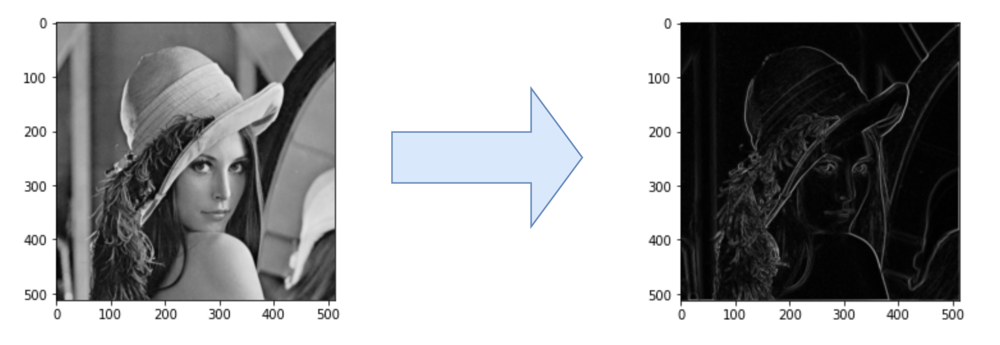

## Ссылка на материалы



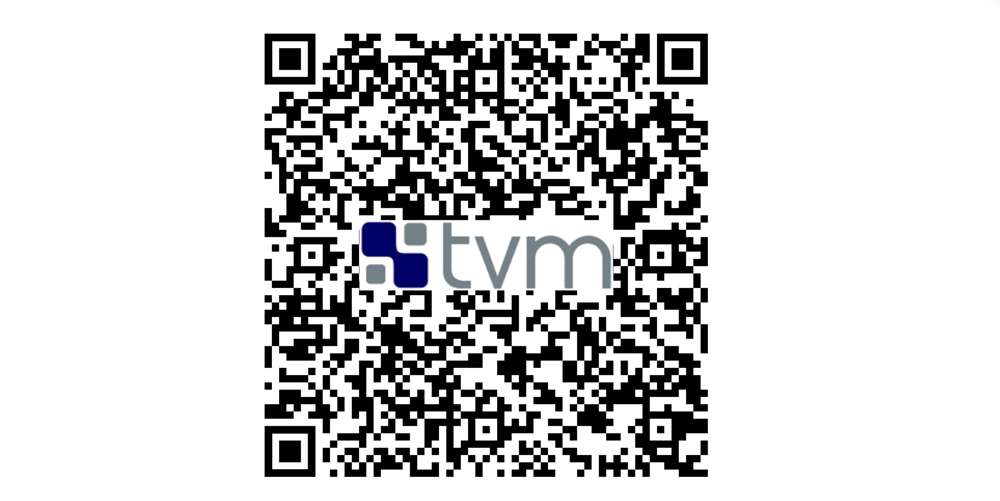

# Спасибо за внимание!

email: egor.churaev@deelvin.com / echuraev@hse.ru

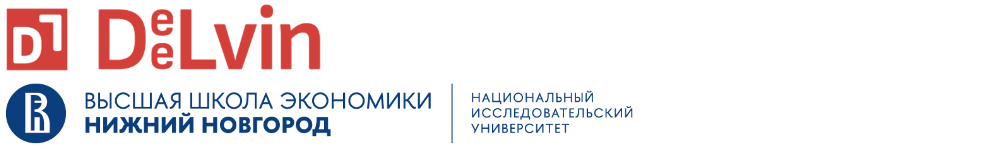